In [1]:
%cd /home

/home


# Settings

Available trainable layers:

In [2]:
trainable_layers_options = ['all', 'first', 'first_encoder', 'last', 'first_and_last', 'first_encoder_decoder', 'first_encoder_decoder_adaptor', 'last_decoder', 'last_decoder_adaptor', 'last_decoder_adaptor_global_feature_loss', 'last_decoder_adaptor_localizer_generator_localizer_loss', 'first_last_decoder_adaptor_localizer_generator_localizer_loss', 'last_decoder_adaptor_global_localizer_localizer_loss']

 Available data augmentation rotation:

In [3]:
data_aug_rot_options = ['full', 'small', '90s', 'null']

Customize:

In [4]:
trainable_layers = 'last_decoder_adaptor_global_localizer_localizer_loss'
depth_trainable = 6  # 1 to 6
data_aug_rot = '90s'
data_aug_rot_max_angle = 360
ckpt_filename = ''  # '' to use the last one
num_epoch = 99
batch_size = 3
with_global = True
patch_interpolation_order = 1
generate_new_dataset_metadata = False
vis_exam_name = '10063F'  # '10074F'
vis_exam_format = '.nii.gz'
alpha_vis = 0.3

In [5]:
vis_exam = vis_exam_name + vis_exam_format

In [6]:
if data_aug_rot not in data_aug_rot_options:
    data_aug_rot = 'full'

In [7]:
if trainable_layers not in trainable_layers_options:
    trainable_layers = 'all'

In [8]:
with open('/tmp/exam_file.txt', 'w') as fw:
    fw.write(vis_exam)

In [9]:
vis_prob_exam = vis_exam_name + '_prob' + vis_exam_format
vis_global_exam = vis_exam_name + '_global' + vis_exam_format

In [10]:
%env VIS_EXAM=$vis_exam

env: VIS_EXAM=10063F.nii.gz


In [11]:
%env VIS_PROB_EXAM=$vis_prob_exam
%env VIS_GLOBAL_EXAM=$vis_global_exam

env: VIS_PROB_EXAM=10063F_prob.nii.gz
env: VIS_GLOBAL_EXAM=10063F_global.nii.gz


# Importing libraries

## File management libraries

In [12]:
from pathlib import Path
from google.colab import drive
import importlib
import shutil
import zipfile
import gzip
import csv
import json

## Machine learning libraries

In [13]:
!pip install medpy PyYAML==5.4.1 pillow colorlog tensorboardX

     |████████████████████████████████| 151 kB 15.7 MB/s 
     |████████████████████████████████| 636 kB 86.7 MB/s 
     |████████████████████████████████| 124 kB 91.4 MB/s 
     |████████████████████████████████| 48.4 MB 1.1 MB/s 
  Created wheel for medpy: filename=MedPy-0.4.0-cp37-cp37m-linux_x86_64.whl size=754463 sha256=ad63eabffb8de31b1aaa754992490dd102cceebad150ad58852c5e1fd0872799
  Stored in directory: /root/.cache/pip/wheels/b0/57/3a/da1183f22a6afb42e11138daa6a759de233fd977a984333602
Successfully built medpy
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [14]:
import time
import os
import sys
import re
from datetime import datetime
import numpy as np
import pandas as pd
import random
import scipy.ndimage
import skimage.transform
import SimpleITK as sitk 
import nibabel as nib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import torch
import torchvision
import tensorboardX
import tensorflow as tf
# import tensorflow_addons as tfa

In [15]:
%matplotlib inline

# Enable the usage of GPU or TPU inside Google Colab

1.   Élément de liste
2.   Élément de liste




Edit -> Notebook Settings -> GPU or TPU

In [16]:
tf.test.gpu_device_name()

'/device:GPU:0'

In [17]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 3224746329734055856
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 14097842176
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 6606162003708352462
 physical_device_desc: "device: 0, name: Tesla V100-SXM2-16GB, pci bus id: 0000:00:04.0, compute capability: 7.0"
 xla_global_id: 416903419]

In [18]:
if torch.cuda.is_available():
    for device_i in range(torch.cuda.device_count()):
        print(torch.cuda.get_device_properties(device_i))

_CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16160MB, multi_processor_count=80)


# Create file system environment for the dataset


## Filenames

In [19]:
inference_config = 'inference_GLIA-Net.yaml'
train_config = 'GLIA-Net.yaml'
eval_config = 'eval_GLIA-Net.yaml'
transfer_config = 'transfer_GLIA-Net.yaml'

In [20]:
aneurysms_filename = 'aneurysms.nii'
struct_aligned_filename = 'struct_aligned.nii'
struct_filename = 'struct.nii'
tof_filename = 'TOF.nii'

aneurysms_gz_filename = aneurysms_filename + '.gz'
struct_aligned_gz_filename = struct_aligned_filename + '.gz'
struct_gz_filename = struct_filename + '.gz'
tof_gz_filename = tof_filename + '.gz'

scan_params_struct_filename = 'ScanParams_struct.json'
scan_params_tof_filename = 'ScanParams_TOF.json'
reg_struct_to_tof_filename = 'reg_struct_to_TOF.txt'
location_filename = 'location.txt'

## Download dataset from Google Drive



Mount Drive in order to retain files between sessions



In [21]:
drive._mount('/gdrive', force_remount=True)

Mounted at /gdrive


In [22]:
drive_GLIA_Net_path = Path("/gdrive/MyDrive/Poli/Poli 2021/TCC2/GLIA-Net")
if not drive_GLIA_Net_path.exists():
    raise FileNotFoundError(f"{drive_GLIA_Net_path.as_posix()} not found!")

In [23]:
drive_project_path = Path("/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM")
if not drive_project_path.exists():
    raise FileNotFoundError(f"{drive_project_path.as_posix()} not found!")

In [24]:
drive_dataset_path = drive_project_path / "dataset"
if not drive_dataset_path.exists():
    raise FileNotFoundError(f"{drive_dataset_path.as_posix()} not found!")

In [25]:
drive_images_path = drive_project_path / "images"
if not drive_images_path.exists():
    raise FileNotFoundError(f"{drive_images_path.as_posix()} not found!")

In [26]:
drive_models_path = drive_project_path / "models"
if not drive_models_path.exists():
    raise FileNotFoundError(f"{drive_models_path.as_posix()} not found!")

In [27]:
home_path = Path('/home')
if not home_path.exists():
    raise FileNotFoundError(f"{home_path.as_posix()} not found!")

In [28]:
project_path = home_path / 'GLIA-Net'
if project_path.exists():
    raise FileExistsError(f"{project_path.as_posix()} already exists!")

In [29]:
dataset_zip_path = home_path / 'dataset_zip'
if dataset_zip_path.exists():
    raise FileExistsError(f"{dataset_zip_path.as_posix()} already exists!")

In [30]:
dataset_raw_path = home_path / 'dataset'
if dataset_raw_path.exists():
    raise FileExistsError(f"{dataset_raw_path.as_posix()} already exists!")

In [31]:
dataset_path = project_path / 'medical_data'
if dataset_path.exists():
    raise FileExistsError(f"{dataset_path.as_posix()}  already exists!")

In [32]:
dataset_cta_img_path = dataset_path / 'cta_img'
if dataset_cta_img_path.exists():
    raise FileExistsError(f"{dataset_cta_img_path.as_posix()} already exists!")

In [33]:
dataset_tof_img_path = dataset_path / 'tof_img'
if dataset_tof_img_path.exists():
    raise FileExistsError(f"{dataset_tof_img_path.as_posix()} already exists!")

In [34]:
dataset_struct_img_path = dataset_path / 'struct_img'
if dataset_struct_img_path.exists():
    raise FileExistsError(f"{dataset_struct_img_path.as_posix()} already exists!")

In [35]:
dataset_annotation_path = dataset_path / 'ane_seg'
if dataset_annotation_path.exists():
    raise FileExistsError(f"{dataset_annotation_path.as_posix()} already exists!")

In [36]:
dataset_location_path = dataset_path / 'location'
if dataset_location_path.exists():
    raise FileExistsError(f"{dataset_location_path.as_posix()} already exists!")

In [37]:
dataset_output_path = dataset_path / 'output'
if dataset_output_path.exists():
    raise FileExistsError(f"{dataset_output_path.as_posix()} already exists!")

In [38]:
log_ckpt_path = project_path / 'exp' / 'GLIA-Net' / '1'
if log_ckpt_path.exists():
    raise FileExistsError(f"{log_ckpt_path.as_posix()} already exists!")

In [39]:
log_ckpt_drive_path = drive_project_path / '..' / 'GLIA_Net_ADAM_result'
if log_ckpt_drive_path.exists():
    raise FileExistsError(f"{log_ckpt_drive_path.as_posix()} already exists!")

In [40]:
ane_seg_csv_path = dataset_path / 'aneurysm_seg.csv'
if ane_seg_csv_path.exists():
    raise FileExistsError(f"{ane_seg_csv_path.as_posix()}  already exists!")

In [41]:
ane_seg_csv_drive_path = log_ckpt_drive_path / 'aneurysm_seg.csv'
if ane_seg_csv_drive_path.exists():
    raise FileExistsError(f"{ane_seg_csv_drive_path.as_posix()} already exists!")

In [42]:
project_config_path = project_path / 'configs'
if project_config_path.exists():
    raise FileExistsError(f"{project_config_path.as_posix()} already exists!")

In [43]:
output_drive_path = log_ckpt_drive_path / 'output'
if output_drive_path.exists():
    raise FileExistsError(f"{output_drive_path.as_posix()} already exists!")

In [44]:
annotation_drive_path = log_ckpt_drive_path / 'ane_seg'
if annotation_drive_path.exists():
    raise FileExistsError(f"{annotation_drive_path.as_posix()} already exists!")

## Copy GLIA-Net Project

In [45]:
shutil.copytree(drive_GLIA_Net_path, project_path)

PosixPath('/home/GLIA-Net')

In [46]:
%cd /home/GLIA-Net
!ls

/home/GLIA-Net
analyze_performance.py		   exp
artworks			   freeze_example.py
configs				   inference.py
core.py				   medical_data
data_loader.py			   metrics_per_target.png
draft_2.py			   metrics_per_voxel.png
draft_4.py			   model
draft_optimization_performance.py  optimize_performance_full_img.py
draft_verify_loss.py		   readme.md
evaluate_per_case.py		   refine_segmentation.py
evaluate.py			   train.py
evaluation_detection.py		   transfer_model.py
evaluation_segmentation.py	   utils


## Copy dataset

In [47]:
shutil.copytree(drive_dataset_path, dataset_zip_path)

PosixPath('/home/dataset_zip')

### Verify download

In [48]:
def print_tree(path):
    if isinstance(path, str):
        _path = Path(path)
    elif isinstance(path, Path):
        _path = path
    else:
        raise TypeError(f'path must be a string or a pathlib.Path object, got {type(path)}')
    if _path.exists():
        print(_path.as_posix())
        if _path.is_dir():
            for subpath in _path.glob('*'):
                print_tree(subpath)
    else:
        raise FileNotFoundError(f"{_path.as_posix()} not found!")

In [49]:
print_tree(dataset_zip_path)

/home/dataset_zip
/home/dataset_zip/10044B.zip
/home/dataset_zip/10054B.zip
/home/dataset_zip/10063B.zip
/home/dataset_zip/10065B.zip
/home/dataset_zip/10050B.zip
/home/dataset_zip/10072F.zip
/home/dataset_zip/10060F.zip
/home/dataset_zip/10005.zip
/home/dataset_zip/10065F.zip
/home/dataset_zip/10057B.zip
/home/dataset_zip/10006.zip
/home/dataset_zip/10039.zip
/home/dataset_zip/10062F.zip
/home/dataset_zip/10042.zip
/home/dataset_zip/10070B.zip
/home/dataset_zip/10007.zip
/home/dataset_zip/10044F.zip
/home/dataset_zip/10016.zip
/home/dataset_zip/10061B.zip
/home/dataset_zip/10026.zip
/home/dataset_zip/10041.zip
/home/dataset_zip/10077F.zip
/home/dataset_zip/10036.zip
/home/dataset_zip/10017.zip
/home/dataset_zip/10076B.zip
/home/dataset_zip/10078F.zip
/home/dataset_zip/10072B.zip
/home/dataset_zip/10045B.zip
/home/dataset_zip/10002.zip
/home/dataset_zip/10038.zip
/home/dataset_zip/10020.zip
/home/dataset_zip/10075F.zip
/home/dataset_zip/10008.zip
/home/dataset_zip/10055B.zip
/home/data

## Unzip dataset exams' zip files

In [50]:
n_exams = sum(1 for exam_path in dataset_zip_path.glob('*'))
print(f"{dataset_zip_path.as_posix()} with {n_exams} files")

for exam_i, exam_path in enumerate(dataset_zip_path.glob('*')):
    if (100 * exam_i // n_exams) % 5 == 0:
        print(f"{exam_path.name:<10}   : {100 * exam_i / n_exams:2.1f} %")
    with zipfile.ZipFile(exam_path, 'r') as exam_zip:
        exam_zip.extractall(dataset_raw_path)
    exam_path.unlink()

print(f"{exam_path.name:<10}   : 100.0 %\n")
n_exams = sum(1 for exam_path in dataset_raw_path.glob('*'))
print(f"{dataset_path.as_posix()} with {n_exams} files")

/home/dataset_zip with 113 files
10044B.zip   : 0.0 %
10054B.zip   : 0.9 %
10060F.zip   : 5.3 %
10062F.zip   : 10.6 %
10016.zip    : 15.0 %
10061B.zip   : 15.9 %
10017.zip    : 20.4 %
10038.zip    : 25.7 %
10022.zip    : 30.1 %
10021.zip    : 31.0 %
10032.zip    : 35.4 %
10018.zip    : 40.7 %
10052B.zip   : 45.1 %
10001.zip    : 50.4 %
10058F.zip   : 55.8 %
10073F.zip   : 60.2 %
10053B.zip   : 65.5 %
10058B.zip   : 70.8 %
10056F.zip   : 75.2 %
10053F.zip   : 80.5 %
10010.zip    : 85.8 %
10015.zip    : 90.3 %
10062B.zip   : 95.6 %
10066B.zip   : 100.0 %

/home/GLIA-Net/medical_data with 113 files


### Verify unzip exams

In [51]:
print_tree(dataset_zip_path)

/home/dataset_zip


In [52]:
print_tree(dataset_raw_path)

/home/dataset
/home/dataset/10051B
/home/dataset/10051B/aneurysms.nii.gz
/home/dataset/10051B/orig
/home/dataset/10051B/orig/struct_aligned.nii.gz
/home/dataset/10051B/orig/TOF.nii.gz
/home/dataset/10051B/orig/ScanParams_struct.json
/home/dataset/10051B/orig/struct.nii.gz
/home/dataset/10051B/orig/reg_struct_to_TOF.txt
/home/dataset/10051B/orig/ScanParams_TOF.json
/home/dataset/10051B/location.txt
/home/dataset/10051B/pre
/home/dataset/10051B/pre/struct_aligned.nii.gz
/home/dataset/10051B/pre/TOF.nii.gz
/home/dataset/10051B/pre/struct.nii.gz
/home/dataset/10003
/home/dataset/10003/aneurysms.nii.gz
/home/dataset/10003/orig
/home/dataset/10003/orig/struct_aligned.nii.gz
/home/dataset/10003/orig/TOF.nii.gz
/home/dataset/10003/orig/ScanParams_struct.json
/home/dataset/10003/orig/struct.nii.gz
/home/dataset/10003/orig/reg_struct_to_TOF.txt
/home/dataset/10003/orig/ScanParams_TOF.json
/home/dataset/10003/location.txt
/home/dataset/10003/pre
/home/dataset/10003/pre/struct_aligned.nii.gz
/home

In [53]:
dataset_zip_path.rmdir()

In [54]:
!ls medical_data

aneurysm_seg.csv  readme.md


## Move dataset to GLIA-Net project

In [55]:
dataset_tof_img_path.mkdir()
dataset_cta_img_path.mkdir()
dataset_struct_img_path.mkdir()
dataset_annotation_path.mkdir()
dataset_location_path.mkdir()
dataset_output_path.mkdir()

In [56]:
for exam_i, exam_path in enumerate(dataset_raw_path.iterdir()):

    shutil.move(exam_path / 'pre' / tof_gz_filename,
                dataset_tof_img_path / (exam_path.name + '.nii.gz'))
    shutil.move(exam_path / 'pre' / struct_aligned_gz_filename,
                dataset_struct_img_path / (exam_path.name + '.nii.gz'))
    
    shutil.move(exam_path / aneurysms_gz_filename,
                dataset_annotation_path / (exam_path.name + '.nii.gz'))
    shutil.move(exam_path / location_filename,
                dataset_location_path / (exam_path.name + '.txt'))

    shutil.rmtree(exam_path)

shutil.rmtree(dataset_raw_path)

### Verify move

In [57]:
dataset_raw_path.exists()

False

In [58]:
print_tree(dataset_path)

/home/GLIA-Net/medical_data
/home/GLIA-Net/medical_data/ane_seg
/home/GLIA-Net/medical_data/ane_seg/10072B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10050B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10048F.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10005.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10067B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10047F.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10027.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10071F.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10037.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10051B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10059F.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10008.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10026.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10053B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10068B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10059B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10073B.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10030.nii.gz
/home/GLIA-Net/medical_data/ane_seg/10061F

## Update metadata

In [59]:
def downsample_img_itk(img, resize_factor, is_mask=False):
    ref_dimension = img_itk.GetDimension()
    ref_physical_size = np.zeros(img_itk.GetDimension())
    ref_physical_size[:] = [(sz - 1) * spc if sz * spc > mx else mx for sz, spc, mx in zip(img_itk.GetSize(), img_itk.GetSpacing(), ref_physical_size)]

    ref_origin = img_itk.GetOrigin()
    ref_direction = img_itk.GetDirection()

    ref_size = [round(sz/resize_factor) for sz in img_itk.GetSize()]
    ref_spacing = [phys_sz / (sz - 1) for sz, phys_sz in zip(ref_size, ref_physical_size)]

    ref_img = sitk.Image(ref_size, img_itk.GetPixelIDValue())
    ref_img.SetOrigin(ref_origin)
    ref_img.SetSpacing(ref_spacing)
    ref_img.SetDirection(ref_direction)

    ref_center = np.array(ref_img.TransformContinuousIndexToPhysicalPoint(np.array(ref_img.GetSize()) / 2.0))
    
    transform = sitk.AffineTransform(ref_dimension)
    transform.SetMatrix(img_itk.GetDirection())

    transform.SetTranslation(np.array(img_itk.GetOrigin()) - ref_origin)
    centering_transform = sitk.TranslationTransform(ref_dimension)
    centered_transform = sitk.CompositeTransform(transform)
    centered_transform.AddTransform(centering_transform)

    if is_mask:
        interpolator = sitk.sitkNearestNeighbor
    else:
        interpolator = sitk.sitkLinear
    
    return sitk.Resample(img_itk, ref_img, centered_transform, interpolator, 0.0)

In [60]:
def generate_aneursym_segmentation_dataset_file(path, eval_ratio=0.2, include_cta=False, include_tof=True, include_struct=True, verbose=0):

    img_reader = sitk.ImageFileReader()
    img_reader.SetImageIO('NiftiImageIO')

    # write header
    with open(path / 'aneurysm_seg.csv', 'w', newline='') as config_dataset_csv:
        csv_writer = csv.writer(config_dataset_csv)

        header = ["subset", "id", "hospital"]
        if include_cta:
            header.append("cta_img_file")
        if include_tof:
            header.append("tof_img_file")
        if include_struct:
            header.append("struct_img_file")
        header.append("aneurysm_seg_file")

        csv_writer.writerow(header)

    too_big_imgs_list = []

    # write metadata
    with open(path / 'aneurysm_seg.csv', 'a', newline='') as config_dataset_csv:
        csv_writer = csv.writer(config_dataset_csv)

        for path_i, mask_path in enumerate((path / 'ane_seg').glob('*'), 1):

            if include_cta:
                cta_path = path / 'cta_img' / mask_path.name
                if not cta_path.exists():
                    raise FileNotFoundError(f'CTA image not found at {cta_path.as_posix()} !')
            if include_tof:
                tof_path = path / 'tof_img' / mask_path.name
                if not tof_path.exists():
                    raise FileNotFoundError(f'TOF-MRA image not found at {tof_path.as_posix()} !')
            if include_struct:
                struct_path = path / 'struct_img' / mask_path.name
                if not struct_path.exists():
                    raise FileNotFoundError(f'Struct aligned image not found at {struct_path.as_posix()} !')

            img_reader.SetFileName(mask_path.as_posix())
            img_itk = img_reader.Execute()

            if False:
                if img_itk.GetNumberOfPixels() > 580 * 580 * 160: # 600 * 600 * 200:
                    if img_itk.GetSize() == (1024, 1024, 160):
                        too_big_imgs_list.append(mask_path.name)
                    if verbose:
                        if include_cta:
                            print('CTA too big! ---> ', cta_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
                        elif include_tof:
                            print('TOF too big! ---> ', tof_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
                        elif include_struct:
                            print('Struct too big! ---> ', struct_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
                    continue

            row = [
                   'train' if random.random() > eval_ratio else 'eval',
                   'P' + str(path_i).zfill(3),
                   'hos_1',
                   ]
            if include_cta:
                row.append(cta_path.parent.name + '/' + cta_path.name)
            if include_tof:
                row.append(tof_path.parent.name + '/' + tof_path.name)
            if include_struct:
                row.append(struct_path.parent.name + '/' + struct_path.name)
            row.append(mask_path.parent.name + '/' + mask_path.name)

            csv_writer.writerow(row)

    if too_big_imgs_list:
        writer = sitk.ImageFileWriter()

    for mask_filename in too_big_imgs_list:
        print(mask_filename)

        name_parts = mask_name.split('.')
        name_parts_ext = [part + '_ext' if i == 0 else part for i, part in enumerate(name_parts)]
        mask_ext_filename = '.'.join(name_parts_ext)

        mask_path = path / 'ane_seg' / mask_filename
        mask_ext_path = path / 'ane_seg' / mask_ext_filename

        img_reader.SetFileName(mask_path.as_posix())
        img_itk = img_reader.Execute()

        resized_img_itk = downsample_img_itk(img_itk, 16/10, is_mask=True)

        img_writer.SetFileName(mask_ext_path.as_posix())
        img_writer.Execute(resized_img_itk)

        if not mask_path.exists():
            raise FileNotFoundError(f'Mask image not found at {mask_path.as_posix()} !')
        if include_cta:
            cta_path = path / 'cta_img' / mask_filename
            cta_ext_path = path / 'cta_img' / mask_ext_filename
            if not cta_path.exists():
                raise FileNotFoundError(f'CTA image not found at {cta_path.as_posix()} !')

            img_reader.SetFileName(cta_path.as_posix())
            img_itk = img_reader.Execute()

            resized_img_itk = downsample_img_itk(img_itk, 16/10, is_mask=False)

            img_writer.SetFileName(cta_ext_path.as_posix())
            img_writer.Execute(resized_img_itk)
        if include_tof:
            tof_path = path / 'tof_img' / mask_filename
            tof_ext_path = path / 'tof_img' / mask_ext_filename
            if not tof_path.exists():
                raise FileNotFoundError(f'TOF-MRA image not found at {tof_path.as_posix()} !')

            img_reader.SetFileName(tof_path.as_posix())
            img_itk = img_reader.Execute()

            resized_img_itk = downsample_img_itk(img_itk, 16/10, is_mask=False)

            img_writer.SetFileName(tof_ext_path.as_posix())
            img_writer.Execute(resized_img_itk)
        if include_struct:
            struct_path = path / 'struct_img' / mask_filename
            struct_ext_path = path / 'struct_img' / mask_ext_filename
            if not struct_path.exists():
                raise FileNotFoundError(f'Struct aligned image not found at {struct_path.as_posix()} !')

            img_reader.SetFileName(struct_path.as_posix())
            img_itk = img_reader.Execute()

            resized_img_itk = downsample_img_itk(img_itk, 16/10, is_mask=False)

            img_writer.SetFileName(struct_ext_path.as_posix())
            img_writer.Execute(resized_img_itk)

In [61]:
if not generate_new_dataset_metadata and (drive_GLIA_Net_path / 'medical_data' / 'aneurysm_seg.csv').exists():
    dataset_info_df = pd.read_csv(drive_GLIA_Net_path / 'medical_data' / 'aneurysm_seg.csv')
    if 'tof_img_file' in dataset_info_df.columns:
        shutil.copy(drive_GLIA_Net_path / 'medical_data' / 'aneurysm_seg.csv', dataset_path / 'aneurysm_seg.csv')
    else:
        generate_aneursym_segmentation_dataset_file(dataset_path, eval_ratio=0.2, include_cta=False, include_tof=True, include_struct=True, verbose=1)
        dataset_info_df = pd.read_csv(dataset_path / 'aneurysm_seg.csv')
        while (dataset_info_df[dataset_info_df['aneurysm_seg_file'] == 'ane_seg/' + vis_exam]['subset'] == 'train').any():
            generate_aneursym_segmentation_dataset_file(dataset_path, eval_ratio=0.2, include_cta=False, include_tof=True, include_struct=True)
            dataset_info_df = pd.read_csv(dataset_path / 'aneurysm_seg.csv')
else:
    generate_aneursym_segmentation_dataset_file(dataset_path, eval_ratio=0.2, include_cta=False, include_tof=True, include_struct=True, verbose=1)
    dataset_info_df = pd.read_csv(dataset_path / 'aneurysm_seg.csv')
    while (dataset_info_df[dataset_info_df['aneurysm_seg_file'] == 'ane_seg/' + vis_exam]['subset'] == 'train').any():
        generate_aneursym_segmentation_dataset_file(dataset_path, eval_ratio=0.2, include_cta=False, include_tof=True, include_struct=True)
        dataset_info_df = pd.read_csv(dataset_path / 'aneurysm_seg.csv')

### Visualize metadata

In [62]:
dataset_info_df = pd.read_csv(dataset_path / 'aneurysm_seg.csv')

In [63]:
len(dataset_info_df)

113

In [64]:
dataset_info_df.tail(10)

,subset,id,hospital,tof_img_file,struct_img_file,aneurysm_seg_file
103,train,P114,hos_1,tof_img/10059F.nii.gz,struct_img/10059F.nii.gz,ane_seg/10059F.nii.gz
104,train,P115,hos_1,tof_img/10076F.nii.gz,struct_img/10076F.nii.gz,ane_seg/10076F.nii.gz
105,train,P116,hos_1,tof_img/10026.nii.gz,struct_img/10026.nii.gz,ane_seg/10026.nii.gz
106,train,P117,hos_1,tof_img/10072B.nii.gz,struct_img/10072B.nii.gz,ane_seg/10072B.nii.gz
107,train,P118,hos_1,tof_img/10053B.nii.gz,struct_img/10053B.nii.gz,ane_seg/10053B.nii.gz
108,train,P119,hos_1,tof_img/10020.nii.gz,struct_img/10020.nii.gz,ane_seg/10020.nii.gz
109,train,P120,hos_1,tof_img/10068F.nii.gz,struct_img/10068F.nii.gz,ane_seg/10068F.nii.gz
110,train,P121,hos_1,tof_img/10060B.nii.gz,struct_img/10060B.nii.gz,ane_seg/10060B.nii.gz
111,train,P122,hos_1,tof_img/10041.nii.gz,struct_img/10041.nii.gz,ane_seg/10041.nii.gz
112,train,P123,hos_1,tof_img/10063B.nii.gz,struct_img/10063B.nii.gz,ane_seg/10063B.nii.gz


In [65]:
dataset_info_df[dataset_info_df['aneurysm_seg_file'] == 'ane_seg/' + vis_exam]

,subset,id,hospital,tof_img_file,struct_img_file,aneurysm_seg_file
61,eval,P070,hos_1,tof_img/10063F.nii.gz,struct_img/10063F.nii.gz,ane_seg/10063F.nii.gz


In [66]:
dataset_info_df.to_csv(dataset_path / 'aneurysm_seg.csv', index=False)

In [67]:
def add_too_big_imgs_as_smaller_imgs():
    too_big_imgs_list = [
                        '10059F.nii.gz',
                        '10076F.nii.gz',
                        '10026.nii.gz',
                        '10072B.nii.gz',
                        '10053B.nii.gz',
                        '10020.nii.gz',
                        '10068F.nii.gz',
                        '10060B.nii.gz',
                        ]

    img_reader = sitk.ImageFileReader()
    img_reader.SetImageIO('NiftiImageIO')

    img_writer = sitk.ImageFileWriter()

    with open(dataset_path / 'aneurysm_seg.csv', 'a', newline='') as config_dataset_csv:
        csv_writer = csv.writer(config_dataset_csv)

        for img_i, img_name in enumerate(too_big_imgs_list, 1):
            ext_name = img_name.split('.')[0] + '_ext.nii.gz'

            mask_path = dataset_path / 'ane_seg' / img_name
            tof_path = dataset_path / 'tof_img' / img_name
            struct_path = dataset_path / 'struct_img' / img_name

            mask_ext_path = dataset_path / 'ane_seg' / ext_name
            tof_ext_path = dataset_path / 'tof_img' / ext_name
            struct_ext_path = dataset_path / 'struct_img' / ext_name

            row = ['train', 'P' + str(113 + img_i), 'hos_1']
            row.append(tof_path.parent.name + '/' + tof_ext_path.name)
            row.append(struct_path.parent.name + '/' + struct_ext_path.name)
            row.append(mask_path.parent.name + '/' + mask_ext_path.name)

            print(row)

            csv_writer.writerow(row)

            # Resize mask
            img_reader.SetFileName(mask_path.as_posix())
            img_itk = img_reader.Execute()

            resized_img = downsample_img_itk(img_itk, 16/10, True)
            
            img_writer.SetFileName(mask_ext_path.as_posix())
            img_writer.Execute(resized_img)

            # Resize tof
            img_reader.SetFileName(tof_path.as_posix())
            img_itk = img_reader.Execute()

            resized_img = downsample_img_itk(img_itk, 16/10, False)
            
            img_writer.SetFileName(tof_ext_path.as_posix())
            img_writer.Execute(resized_img)

            # Resize struct
            img_reader.SetFileName(struct_path.as_posix())
            img_itk = img_reader.Execute()

            resized_img = downsample_img_itk(img_itk, 16/10, False)
            
            img_writer.SetFileName(struct_ext_path.as_posix())
            img_writer.Execute(resized_img)

In [68]:
#add_too_big_imgs_as_smaller_imgs()

In [69]:
dataset_info_df_ext = pd.read_csv(dataset_path / 'aneurysm_seg.csv')

In [70]:
dataset_info_df_ext.tail(15)

,subset,id,hospital,tof_img_file,struct_img_file,aneurysm_seg_file
98,eval,P109,hos_1,tof_img/10077F.nii.gz,struct_img/10077F.nii.gz,ane_seg/10077F.nii.gz
99,train,P110,hos_1,tof_img/10076B.nii.gz,struct_img/10076B.nii.gz,ane_seg/10076B.nii.gz
100,eval,P111,hos_1,tof_img/10071B.nii.gz,struct_img/10071B.nii.gz,ane_seg/10071B.nii.gz
101,train,P112,hos_1,tof_img/10038.nii.gz,struct_img/10038.nii.gz,ane_seg/10038.nii.gz
102,eval,P113,hos_1,tof_img/10012.nii.gz,struct_img/10012.nii.gz,ane_seg/10012.nii.gz
103,train,P114,hos_1,tof_img/10059F.nii.gz,struct_img/10059F.nii.gz,ane_seg/10059F.nii.gz
104,train,P115,hos_1,tof_img/10076F.nii.gz,struct_img/10076F.nii.gz,ane_seg/10076F.nii.gz
105,train,P116,hos_1,tof_img/10026.nii.gz,struct_img/10026.nii.gz,ane_seg/10026.nii.gz
106,train,P117,hos_1,tof_img/10072B.nii.gz,struct_img/10072B.nii.gz,ane_seg/10072B.nii.gz
107,train,P118,hos_1,tof_img/10053B.nii.gz,struct_img/10053B.nii.gz,ane_seg/10053B.nii.gz


In [71]:
print(len(dataset_info_df_ext))

113


In [72]:
print(len(dataset_info_df_ext[dataset_info_df_ext['subset'] == 'train']))

90


In [73]:
print(len(dataset_info_df_ext[dataset_info_df_ext['subset'] == 'eval']))

23


In [74]:
!ls medical_data

ane_seg		  cta_img   output     struct_img
aneurysm_seg.csv  location  readme.md  tof_img


# GLIA-Net aneurysm segmentation

In [75]:
!pwd
!ls

/home/GLIA-Net
analyze_performance.py		   exp
artworks			   freeze_example.py
configs				   inference.py
core.py				   medical_data
data_loader.py			   metrics_per_target.png
draft_2.py			   metrics_per_voxel.png
draft_4.py			   model
draft_optimization_performance.py  optimize_performance_full_img.py
draft_verify_loss.py		   readme.md
evaluate_per_case.py		   refine_segmentation.py
evaluate.py			   train.py
evaluation_detection.py		   transfer_model.py
evaluation_segmentation.py	   utils


In [76]:
if torch.cuda.is_available():
    for device_i in range(torch.cuda.device_count()):
        print(torch.cuda.get_device_properties(device_i))

_CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16160MB, multi_processor_count=80)


In [77]:
ckpt_path = project_path / 'exp' / 'GLIA-Net' / '1' / 'ckpt'
drive_ckpt_path = drive_GLIA_Net_path / 'exp' / 'GLIA-Net' / '1' / 'ckpt'

In [78]:
print([ckpt.name for ckpt in ckpt_path.glob('*')])
print([ckpt.name for ckpt in drive_ckpt_path.glob('*')])

['checkpoint-0307851.pt', 'checkpoint-0320281.pt', 'checkpoint-0345141.pt', 'best_checkpoint-0.3670.pt', 'checkpoint-0245700.pt', 'checkpoint-0332711.pt', 'checkpoint-0295421.pt', 'checkpoint-0357571.pt']
['checkpoint-0245700.pt', 'checkpoint-0295421.pt', 'checkpoint-0307851.pt', 'checkpoint-0320281.pt', 'checkpoint-0332711.pt', 'checkpoint-0345141.pt', 'checkpoint-0357571.pt', 'best_checkpoint-0.3670.pt']


In [79]:
#shutil.copy(list(drive_ckpt_path.glob('best*.pt'))[0], ckpt_path)

## Transfer Learning

In [80]:
def update_with_global_net(config_path, with_global, transfer_learning=False):
    
    if transfer_learning:
        global_pattern = re.compile(r'new_with_global:[ ]*(True|False)')
    else:
        global_pattern = re.compile(r'with_global:[ ]*(True|False)')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    if transfer_learning:
        updated_lines = global_pattern.sub('new_with_global: ' + str(with_global), lines)
    else:
        updated_lines = global_pattern.sub('with_global: ' + str(with_global), lines)

    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [81]:
for config_path in project_config_path.glob('*.yaml'):
    if 'transfer' in config_path.name:
        update_with_global_net(config_path, with_global, True)
    else:
        update_with_global_net(config_path, with_global, False)

In [82]:
!python transfer_model.py -c transfer_GLIA-Net

2021-12-07 11:42:43 [MainThread] INFO [TaskAneurysmSegTransfer] - use device 0
2021-12-07 11:42:47 [MainThread] INFO [TaskAneurysmSegTransfer] - Checkpoint 'exp/GLIA-Net/1/ckpt/checkpoint-0245700.pt' loaded
2021-12-07 11:42:47 [MainThread] INFO [TaskAneurysmSegTransfer] - Latest checkpoint saved to 'exp/GLIA-Net/1/ckpt/checkpoint-0245701.pt'


In [83]:
!ls exp/GLIA-Net/1/ckpt

best_checkpoint-0.3670.pt  checkpoint-0295421.pt  checkpoint-0332711.pt
checkpoint-0245700.pt	   checkpoint-0307851.pt  checkpoint-0345141.pt
checkpoint-0245701.pt	   checkpoint-0320281.pt  checkpoint-0357571.pt


In [84]:
!ls exp/GLIA-Net/1/logs

2021-12-07#11-42-43.log


In [85]:
!cat $(find exp/GLIA-Net/1/logs -name "????-??-??#??-??-??.log" | sort)

2021-12-07 11:42:43 [MainThread] INFO [TaskAneurysmSegTransfer] - use device 0
2021-12-07 11:42:47 [MainThread] INFO [TaskAneurysmSegTransfer] - Checkpoint 'exp/GLIA-Net/1/ckpt/checkpoint-0245700.pt' loaded
2021-12-07 11:42:47 [MainThread] INFO [TaskAneurysmSegTransfer] - Latest checkpoint saved to 'exp/GLIA-Net/1/ckpt/checkpoint-0245701.pt'


## Update configuration files

In [86]:
!ls exp/GLIA-Net/1/ckpt

best_checkpoint-0.3670.pt  checkpoint-0295421.pt  checkpoint-0332711.pt
checkpoint-0245700.pt	   checkpoint-0307851.pt  checkpoint-0345141.pt
checkpoint-0245701.pt	   checkpoint-0320281.pt  checkpoint-0357571.pt


In [87]:
there_is_best = False
if [ckpt for ckpt in (project_path/'exp'/'GLIA-Net'/'1'/'ckpt').glob('best_checkpoint*.pt')]:
    best_ckpt_filename = f"best_checkpoint-{max([float(ckpt.name[len('best_checkpoint-'):-3]) for ckpt in (project_path/'exp'/'GLIA-Net'/'1'/'ckpt').glob('best_checkpoint*.pt')]):.4f}.pt"
    there_is_best = True

In [88]:
!ls configs

eval_GLIA-Net.yaml  GLIA-Net.yaml	     transfer_GLIA-Net.yaml
eval_per_case.yaml  inference_GLIA-Net.yaml


In [89]:
shutil.copy2(drive_GLIA_Net_path / 'configs' / 'inference_GLIA-Net.yaml', project_path / 'configs')
shutil.copy2(drive_GLIA_Net_path / 'configs' / 'GLIA-Net.yaml', project_path / 'configs')
shutil.copy2(drive_GLIA_Net_path / 'configs' / 'eval_GLIA-Net.yaml', project_path / 'configs')

'/home/GLIA-Net/configs/eval_GLIA-Net.yaml'

In [90]:
for i in (project_config_path).glob('*'):
    print(i)

/home/GLIA-Net/configs/transfer_GLIA-Net.yaml
/home/GLIA-Net/configs/eval_GLIA-Net.yaml
/home/GLIA-Net/configs/eval_per_case.yaml
/home/GLIA-Net/configs/inference_GLIA-Net.yaml
/home/GLIA-Net/configs/GLIA-Net.yaml


In [91]:
def get_last_checkpoint():
    ckpt_list = [int(ckpt.name.replace('checkpoint-', '').replace('.pt', '')) for ckpt in (project_path / 'exp' / 'GLIA-Net' /  '1' / 'ckpt').glob('checkpoint-???????.pt')]
    return f'checkpoint-{max(ckpt_list):07d}.pt'

In [92]:
def update_ckpt_on_config_file(config_path, ckpt_filename=''):
    
    if ckpt_filename == '':
        if there_is_best:
            ckpt_filename = best_ckpt_filename
        else:
            ckpt_filename = get_last_checkpoint()
    
    ckpt_pattern = re.compile(r'checkpoint-[0-9]{7}.pt')
    ckpt_null_pattern = re.compile(r'ckpt_file:[ ]*null')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    updated_lines = ckpt_pattern.sub(ckpt_filename, lines)
    updated_lines = ckpt_null_pattern.sub('ckpt_file: ' + ckpt_filename, updated_lines)
    
    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [93]:
def update_trainable_layers(config_path, trainable_layers, depth=1):
    
    trainable_pattern = re.compile(r'trainable_layers:[ ]*(all|first_and_last|first_encoder_decoder|first_encoder|first|last)')
    depth_pattern = re.compile(r'depth_trainable_layers:[ ]*[0-9]+')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    updated_lines = trainable_pattern.sub('trainable_layers: ' + trainable_layers, lines)
    updated_lines = depth_pattern.sub('depth_trainable_layers: ' + str(depth), updated_lines)

    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [94]:
def update_num_epoch(config_path, num_epoch):

    num_epoch_pattern = re.compile(r'num_epoch:[ ]*[-]?[0-9]+')
    num_pattern = re.compile(r'[-]?[0-9]+')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    match = num_epoch_pattern.search(lines)
    if match is None:
        old_num_epoch = 0
    else:
        match_num = num_pattern.search(match[0])
        old_num_epoch = int(match_num[0])

    updated_lines = num_epoch_pattern.sub('num_epoch: ' + str(old_num_epoch + num_epoch), lines)

    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [95]:
def update_batch_size(config_path, num_epoch):

    batch_size_pattern = re.compile(r'batch_size:[ ]*[-]?[0-9]+')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    updated_lines = batch_size_pattern.sub('batch_size: ' + str(batch_size), lines)

    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [96]:
def update_patch_interpolation_order(config_path, order):

    patch_interpolation_order_pattern = re.compile(r'patch_interpolation_order:[ ]*[0-9]')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    updated_lines = patch_interpolation_order_pattern.sub('patch_interpolation_order: ' + str(patch_interpolation_order), lines)

    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [97]:
def update_data_augmentation_rotation(config_path, rot_type, max_angle):

    rot_type_pattern = re.compile(r'rotation:[ ]*[A-Za-z]+')
    angle_type_pattern = re.compile(r'max_angle:[ ]*[0-9]+')

    with open(config_path, 'r') as fr:
        lines = fr.read()

    updated_lines = rot_type_pattern.sub('rotation: ' + rot_type, lines)
    updated_lines = angle_type_pattern.sub('max_angle: ' + str(max_angle), updated_lines)

    with open(config_path, 'w') as fw:
        fw.write(updated_lines)

In [98]:
for config_path in project_config_path.glob('*.yaml'):
    
    if config_path == project_config_path / transfer_config:
        continue

    update_ckpt_on_config_file(config_path, ckpt_filename)

In [99]:
update_trainable_layers(project_config_path / train_config, trainable_layers, depth_trainable)

In [100]:
update_num_epoch(project_config_path / train_config, num_epoch)

In [101]:
update_batch_size(project_config_path / train_config, batch_size)

In [102]:
update_data_augmentation_rotation(project_config_path / train_config, data_aug_rot, data_aug_rot_max_angle)

In [103]:
update_patch_interpolation_order(project_config_path / inference_config, patch_interpolation_order)

In [104]:
!cat configs/transfer_GLIA-Net.yaml

task: AneurysmSeg
logging_folder: logs
ckpt_folder: ckpt
summary_folder: summary
load_best_model: False  # if false, load last. else load best checkpoint
ckpt_file: checkpoint-0245700.pt  # ckpt file name to load. set null to load the latest ckpt
new_ckpt_file: checkpoint-0245701.pt  # ckpt file name to save

# will be sent to model as kwargs
model:
  filename: GLIA-Net
  classname: GLIANet
  with_global: True  # whether use global positioning network
  new_with_global: True
  global_type: attention_map
  global_out_channels: 2
  in_channels: 3
  new_in_channels: 1
  out_channels: 2
  new_out_channels: 2
  num_classes: 2  # usually same to out_channels
  f_maps: [16, 32, 64, 128]
  norm_type: gn  # bn (batch norm), in (instance norm), gn (group norm) or sn (switchable norm)

data:
  features:
    tof_img_file: image
  normalization: z_norm
  img_spacing: null  # set null if you don't want to change spacing. e.g. [0.5, 0.5, 0.5]
  patch_size: [96, 96, 96]  # depth, width, height
  overl

In [105]:
!cat configs/inference_GLIA-Net.yaml

task: AneurysmSeg
logging_folder: logs
ckpt_folder: ckpt
summary_folder: summary
load_best_model: False  # if false, load last. else load best checkpoint
ckpt_file: best_checkpoint-0.3670.pt  # ckpt file name to load. set null to load the latest ckpt

# will be sent to model as kwargs
model:
  filename: GLIA-Net
  classname: GLIANet
  with_global: True  # whether use global positioning network
  global_type: attention_map
  global_out_channels: 2
  in_channels: 1
  out_channels: 2
  num_classes: 2  # usually same to out_channels
  f_maps: [16, 32, 64, 128]
  norm_type: gn  # bn (batch norm), in (instance norm), gn (group norm) or sn (switchable norm)

data:
  features:
    tof_img_file: image
  normalization: z_norm
  hu_values: [[0, 100], [100, 200], [200, 800]]  # HU value intervals  for input images. Length should be same as in_channels
  img_spacing: [0.499999, 0.35714287, 0.35714287]  # set null if you don't want to change spacing. e.g. [0.5, 0.5, 0.5]
  patch_size: [96, 96, 96]  

In [106]:
!cat configs/GLIA-Net.yaml

task: AneurysmSeg
logging_folder: logs
ckpt_folder: ckpt
summary_folder: summary
load_best_model: False  # if false, load last ckpt. else load best checkpoint
ckpt_file: best_checkpoint-0.3670.pt  # ckpt file name to load. set null to load the latest ckpt
log_every_n_iters: 10  # every n iters log to logger

# will be sent to model as kwargs
model:
  filename: GLIA-Net
  classname: GLIANet
  with_global: True  # whether use global positioning network
  global_type: attention_map
  global_out_channels: 2
  in_channels: 1
  out_channels: 2
  num_classes: 2  # usually same to out_channels
  f_maps: [16, 32, 64, 128]
  norm_type: gn  # bn (batch norm), in (instance norm), gn (group norm) or sn (switchable norm)

data:
  features:
    tof_img_file: image
  labels:
    aneurysm_seg_file: mask
  normalization: z_norm
  hu_values: [[0, 100], [100, 200], [200, 800]]  # HU value intervals  for input images. Length should be same as in_channels
  data_root: # path to the dataset and can be differ

## Inference

In [107]:
dataset_info_df[dataset_info_df['aneurysm_seg_file'] == 'ane_seg/' + vis_exam]

,subset,id,hospital,tof_img_file,struct_img_file,aneurysm_seg_file
61,eval,P070,hos_1,tof_img/10063F.nii.gz,struct_img/10063F.nii.gz,ane_seg/10063F.nii.gz


In [108]:
with open(dataset_location_path / (vis_exam.split('.')[0] + '.txt')) as fr:
    location_lines = fr.readlines()

if not location_lines:
    ane_x, ane_y, ane_z = 0, 0, 0
    print('Warning: Exam without aneurysms!')

location_content = [[int(val) for val in line.split(', ')[:3]] for line in location_lines]

ane_x, ane_y, ane_z = location_content[0]
print(f'Aneurysm at (x={ane_x}, y={ane_y}, z={ane_z})')

Aneurysm at (x=312, y=227, z=40)


### Visualize input image

In [109]:
img_reader = sitk.ImageFileReader()
img_reader.SetImageIO('NiftiImageIO')

In [110]:
# read input image
img_reader.SetFileName((dataset_tof_img_path / vis_exam).absolute().as_posix())
input_tof_img_itk = img_reader.Execute()

print('Class                :', type(input_tof_img_itk))
print('Number of dimensions :', input_tof_img_itk.GetDimension())
print('Size                 :', input_tof_img_itk.GetSize())
print('Number of voxels     :', input_tof_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [111]:
img_reader.SetFileName((dataset_struct_img_path / vis_exam).absolute().as_posix())
input_struct_img_itk = img_reader.Execute()

print('Class                :', type(input_struct_img_itk))
print('Number of dimensions :', input_struct_img_itk.GetDimension())
print('Size                 :', input_struct_img_itk.GetSize())
print('Number of voxels     :', input_struct_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


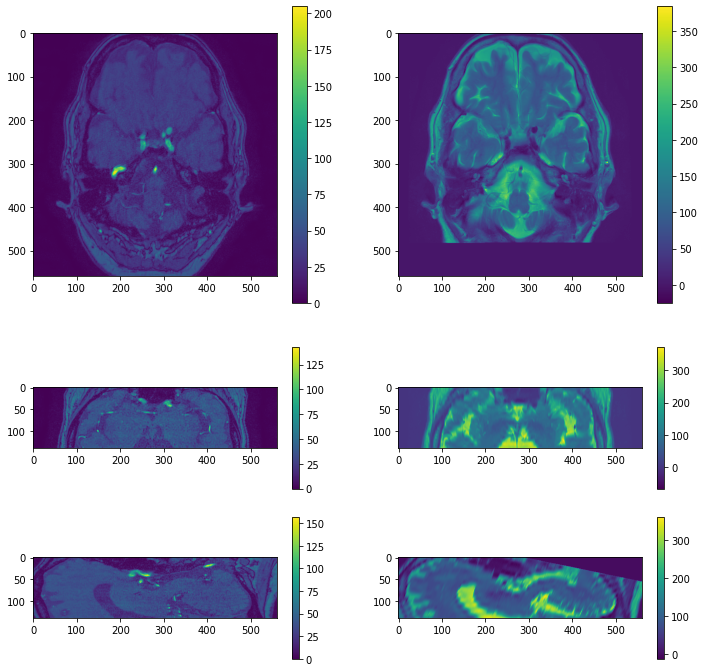

In [112]:
input_tof_img_np = sitk.GetArrayViewFromImage(input_tof_img_itk)
input_struct_img_np = sitk.GetArrayViewFromImage(input_struct_img_itk)

plt.figure(figsize=(12, 12))
plt.subplot(2, 2, 1)
plt.imshow(input_tof_img_np[ane_z,:,:])
plt.colorbar()

plt.subplot(2, 2, 2)
plt.imshow(input_struct_img_np[ane_z,:,:])
plt.colorbar()

plt.subplot(4, 2, 5)
plt.imshow(input_tof_img_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 2, 6)
plt.imshow(input_struct_img_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 2, 7)
plt.imshow(input_tof_img_np[:,:,ane_x])
plt.colorbar()

plt.subplot(4, 2, 8)
plt.imshow(input_struct_img_np[:,:,ane_x])
plt.colorbar()

### Predict aneurysm mask

In [113]:
!python inference.py \
    -c inference_GLIA-Net \
    -i /home/GLIA-Net/medical_data/tof_img/$VIS_EXAM,/home/GLIA-Net/medical_data/struct_img/$VIS_EXAM \
    -t nii \
    -p y -g y \
    -d 0 \
    -o /tmp/

2021-12-07 11:42:58 [MainThread] INFO [TaskAneurysmSegInferencer] - use device 0
2021-12-07 11:43:02 [MainThread] INFO [TaskAneurysmSegInferencer] - Checkpoint 'exp/GLIA-Net/1/ckpt/best_checkpoint-0.3670.pt' loaded
2021-12-07 11:43:02 [MainThread] INFO [TaskAneurysmSegInferencer] - Begin to scan input_folder_or_file ('/home/GLIA-Net/medical_data/tof_img/10063F.nii.gz', '/home/GLIA-Net/medical_data/struct_img/10063F.nii.gz')...
2021-12-07 11:43:05 [MainThread] INFO [TaskAneurysmSegInferencer] - inference instance 10063F.nii.gz (242 patches)...
	processing procedure: 0.0%tcmalloc: large alloc 1404928000 bytes == 0x556eab0ce000 @  0x7f84f5fb3001 0x7f84f335e54f 0x7f84f33aeb58 0x7f84f33b2b17 0x7f84f3451203 0x556d1defc544 0x556d1defc240 0x556d1df70627 0x556d1df6a9ee 0x556d1defdbda 0x556d1df6fd00 0x556d1df6a9ee 0x556d1defdbda 0x556d1df6c737 0x556d1df6a9ee 0x556d1defdbda 0x556d1df6c737 0x556d1df6aced 0x556d1defdbda 0x556d1df6c737 0x556d1df6aced 0x556d1defdbda 0x556d1df6c737 0x556d1df6aced 0x55

In [114]:
!ls /home/GLIA-Net/medical_data/tof_img/$VIS_EXAM
!ls /home/GLIA-Net/medical_data/struct_img/$VIS_EXAM

/home/GLIA-Net/medical_data/tof_img/10063F.nii.gz
/home/GLIA-Net/medical_data/struct_img/10063F.nii.gz


### Visualize predicted aneurysm and ground truth mask 

In [115]:
!ls /tmp/*.nii.gz

/tmp/10063F_global.nii.gz  /tmp/10063F.nii.gz  /tmp/10063F_prob.nii.gz


In [116]:
img_reader.SetFileName('/tmp/' + vis_exam)
pred_img_itk = img_reader.Execute()

print('Class                :', type(pred_img_itk))
print('Number of dimensions :', pred_img_itk.GetDimension())
print('Size                 :', pred_img_itk.GetSize())
print('Number of voxels     :', pred_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [117]:
img_reader.SetFileName('/tmp/' + vis_prob_exam)
prob_img_itk = img_reader.Execute()

print('Class                :', type(prob_img_itk))
print('Number of dimensions :', prob_img_itk.GetDimension())
print('Size                 :', prob_img_itk.GetSize())
print('Number of voxels     :', prob_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [118]:
if with_global:
    img_reader.SetFileName('/tmp/' + vis_global_exam)
    global_img_itk = img_reader.Execute()
    
    print('Class                :', type(global_img_itk))
    print('Number of dimensions :', global_img_itk.GetDimension())
    print('Size                 :', global_img_itk.GetSize())
    print('Number of voxels     :', global_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [119]:
img_reader.SetFileName((dataset_annotation_path / vis_exam).absolute().as_posix())
true_img_itk = img_reader.Execute()

print('Class                :', type(true_img_itk))
print('Number of dimensions :', true_img_itk.GetDimension())
print('Size                 :', true_img_itk.GetSize())
print('Number of voxels     :', true_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


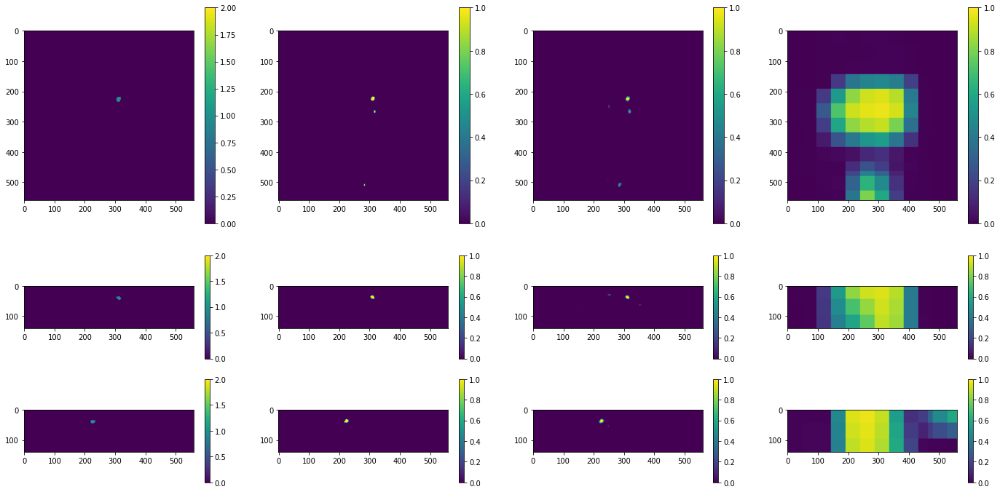

In [120]:
true_img_np = sitk.GetArrayViewFromImage(true_img_itk)
pred_img_np = sitk.GetArrayViewFromImage(pred_img_itk)
prob_img_np = sitk.GetArrayViewFromImage(prob_img_itk)

if with_global:
    global_img_np = sitk.GetArrayViewFromImage(global_img_itk)

plt.figure(figsize=(24, 12))
plt.subplot(2, 4, 1)
plt.imshow(true_img_np[ane_z,:,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(2, 4, 2)
plt.imshow(pred_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(2, 4, 3)
plt.imshow(prob_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(2, 4, 4)
    plt.imshow(global_img_np[ane_z,:,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 4, 9)
plt.imshow(true_img_np[:,ane_y,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 4, 10)
plt.imshow(pred_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 4, 11)
plt.imshow(prob_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 4, 12)
    plt.imshow(global_img_np[:,ane_y,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 4, 13)
plt.imshow(true_img_np[:,:,ane_x], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 4, 14)
plt.imshow(pred_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 4, 15)
plt.imshow(prob_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 4, 16)
    plt.imshow(global_img_np[:,:,ane_x], vmin=0, vmax=1)
    plt.colorbar()

### Visualize exams annotated with ground truth and predicted masks

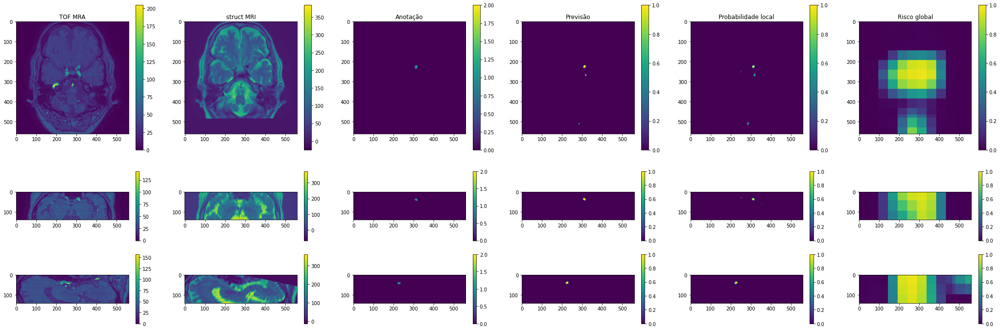

In [121]:
input_tof_img_np = sitk.GetArrayViewFromImage(input_tof_img_itk)
input_struct_img_np = sitk.GetArrayViewFromImage(input_struct_img_itk)
pred_img_np = sitk.GetArrayViewFromImage(pred_img_itk)
true_img_np = sitk.GetArrayViewFromImage(true_img_itk)

plt.figure(figsize=(36, 12))
plt.subplot(2, 6, 1)
plt.imshow(input_tof_img_np[ane_z,:,:])
plt.title('TOF MRA')
plt.colorbar()

plt.subplot(2, 6, 2)
plt.imshow(input_struct_img_np[ane_z,:,:])
plt.title('struct MRI')
plt.colorbar()

plt.subplot(2, 6, 3)
plt.imshow(true_img_np[ane_z,:,:], vmin=0, vmax=2)
plt.title('Anotação')
plt.colorbar()

plt.subplot(2, 6, 4)
plt.imshow(pred_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.title('Previsão')
plt.colorbar()

plt.subplot(2, 6, 5)
plt.imshow(prob_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.title('Probabilidade local')
plt.colorbar()

if with_global:
    plt.subplot(2, 6, 6)
    plt.imshow(global_img_np[ane_z,:,:], vmin=0, vmax=1)
    plt.title('Risco global')
    plt.colorbar()

plt.subplot(4, 6, 13)
plt.imshow(input_tof_img_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 6, 14)
plt.imshow(input_struct_img_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 6, 15)
plt.imshow(true_img_np[:,ane_y,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 6, 16)
plt.imshow(pred_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 6, 17)
plt.imshow(prob_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 6, 18)
    plt.imshow(global_img_np[:,ane_y,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 6, 19)
plt.imshow(input_tof_img_np[:,:,ane_x])
plt.colorbar()

plt.subplot(4, 6, 20)
plt.imshow(input_struct_img_np[:,:,ane_x])
plt.colorbar()

plt.subplot(4, 6, 21)
plt.imshow(true_img_np[:,:,ane_x], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 6, 22)
plt.imshow(pred_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 6, 23)
plt.imshow(prob_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 6, 24)
    plt.imshow(global_img_np[:,:,ane_x], vmin=0, vmax=1)
    plt.colorbar()

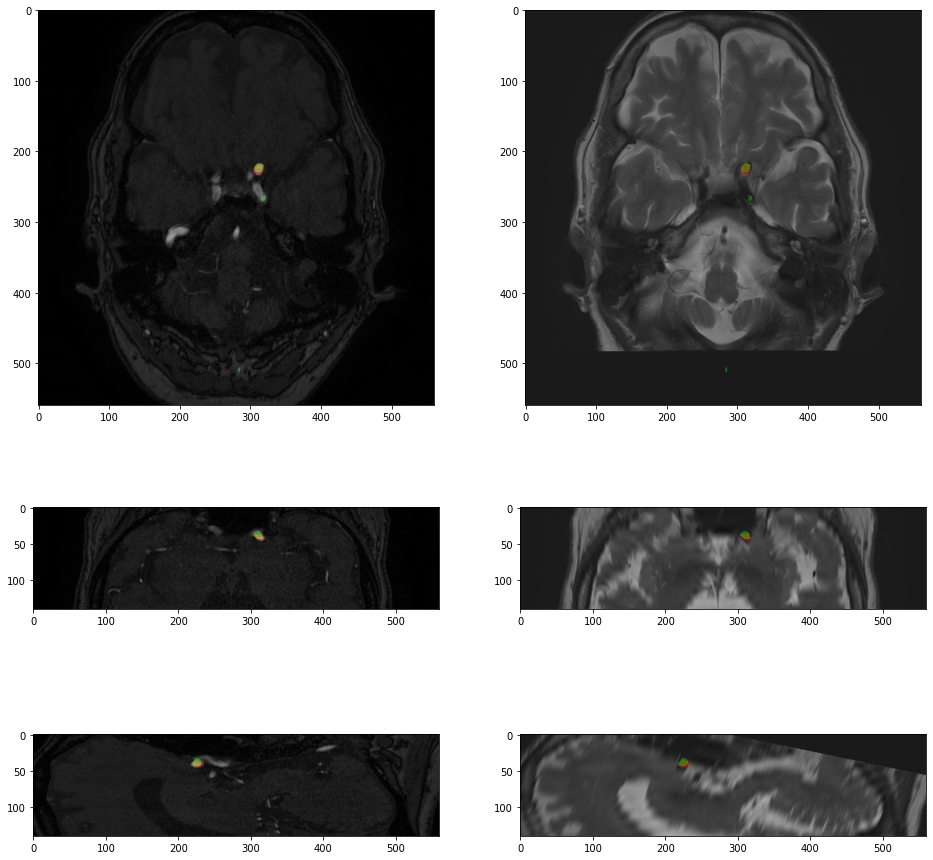

In [122]:
tof_res_img_np = np.stack([input_tof_img_np, input_tof_img_np, input_tof_img_np], -1)
struct_res_img_np = np.stack([input_struct_img_np, input_struct_img_np, input_struct_img_np], -1)

tof_res_img_np = (tof_res_img_np - np.min(tof_res_img_np)) / (np.max(tof_res_img_np) - np.min(tof_res_img_np))
struct_res_img_np = (struct_res_img_np - np.min(struct_res_img_np)) / (np.max(struct_res_img_np) - np.min(struct_res_img_np))

tof_res_img_np = (1 - alpha_vis) * tof_res_img_np
struct_res_img_np = (1 - alpha_vis) * struct_res_img_np

tof_res_img_np[:,:,:,0] = tof_res_img_np[:,:,:,0] + alpha_vis * true_img_np
struct_res_img_np[:,:,:,0] = struct_res_img_np[:,:,:,0] + alpha_vis * true_img_np

tof_res_img_np[:,:,:,1] = tof_res_img_np[:,:,:,1] + alpha_vis * pred_img_np
struct_res_img_np[:,:,:,1] = struct_res_img_np[:,:,:,1] + alpha_vis * pred_img_np

plt.figure(figsize=(16, 16))
plt.subplot(2, 2, 1)
plt.imshow(tof_res_img_np[ane_z,:,:,:])

plt.subplot(2, 2, 2)
plt.imshow(struct_res_img_np[ane_z,:,:,:])

plt.subplot(4, 2, 5)
plt.imshow(tof_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 6)
plt.imshow(struct_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 7)
plt.imshow(tof_res_img_np[:,:,ane_x,:])

plt.subplot(4, 2, 8)
plt.imshow(struct_res_img_np[:,:,ane_x,:])

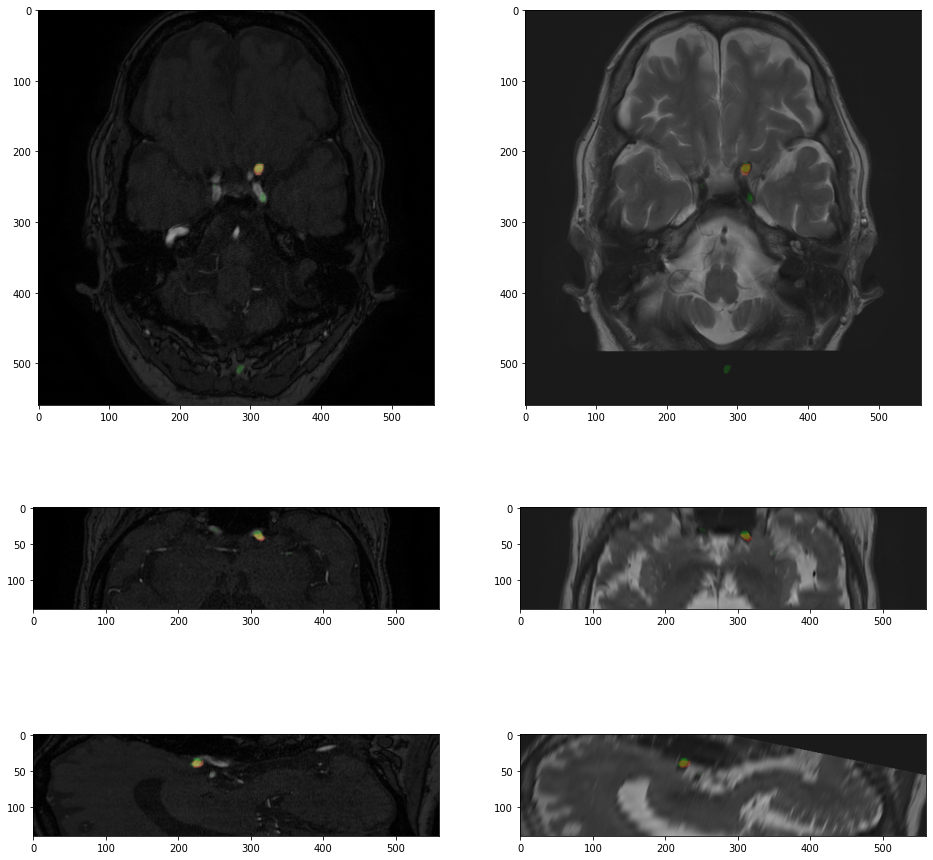

In [123]:
tof_res_img_np = np.stack([input_tof_img_np, input_tof_img_np, input_tof_img_np], -1)
struct_res_img_np = np.stack([input_struct_img_np, input_struct_img_np, input_struct_img_np], -1)

tof_res_img_np = (tof_res_img_np - np.min(tof_res_img_np)) / (np.max(tof_res_img_np) - np.min(tof_res_img_np))
struct_res_img_np = (struct_res_img_np - np.min(struct_res_img_np)) / (np.max(struct_res_img_np) - np.min(struct_res_img_np))

tof_res_img_np = (1 - alpha_vis) * tof_res_img_np
struct_res_img_np = (1 - alpha_vis) * struct_res_img_np

tof_res_img_np[:,:,:,0] = tof_res_img_np[:,:,:,0] + alpha_vis * true_img_np
struct_res_img_np[:,:,:,0] = struct_res_img_np[:,:,:,0] + alpha_vis * true_img_np

tof_res_img_np[:,:,:,1] = tof_res_img_np[:,:,:,1] + alpha_vis * prob_img_np
struct_res_img_np[:,:,:,1] = struct_res_img_np[:,:,:,1] + alpha_vis * prob_img_np

plt.figure(figsize=(16, 16))
plt.subplot(2, 2, 1)
plt.imshow(tof_res_img_np[ane_z,:,:,:])

plt.subplot(2, 2, 2)
plt.imshow(struct_res_img_np[ane_z,:,:,:])

plt.subplot(4, 2, 5)
plt.imshow(tof_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 6)
plt.imshow(struct_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 7)
plt.imshow(tof_res_img_np[:,:,ane_x,:])

plt.subplot(4, 2, 8)
plt.imshow(struct_res_img_np[:,:,ane_x,:])

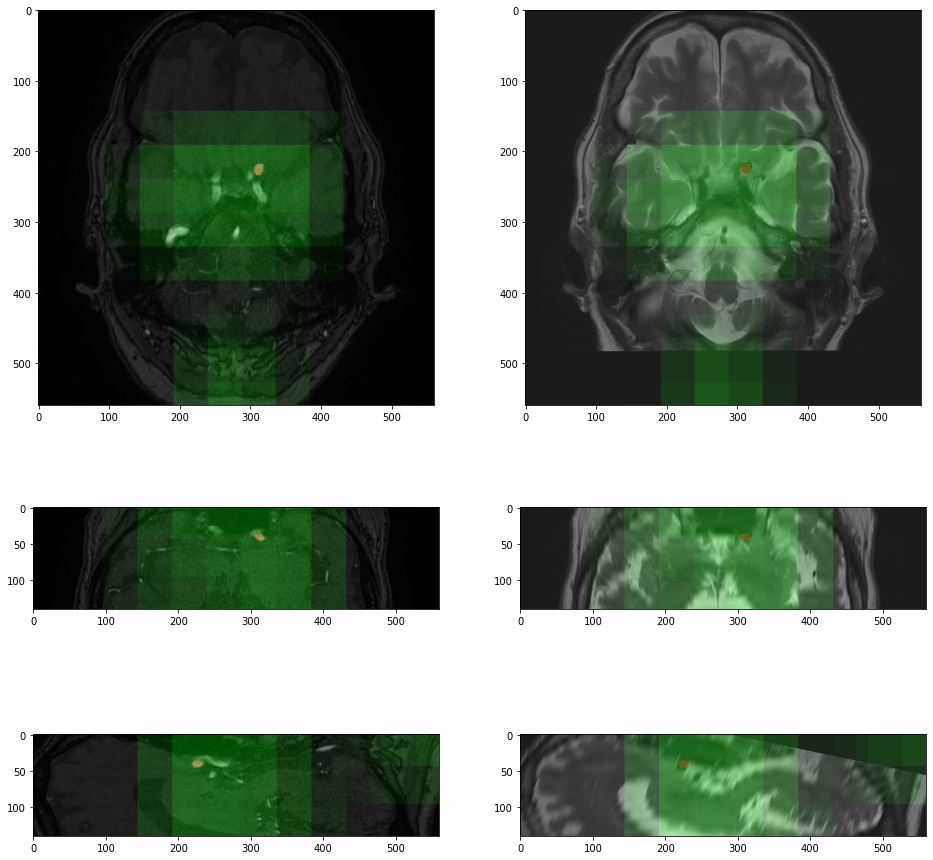

In [124]:
if with_global:
    tof_res_img_np = np.stack([input_tof_img_np, input_tof_img_np, input_tof_img_np], -1)
    struct_res_img_np = np.stack([input_struct_img_np, input_struct_img_np, input_struct_img_np], -1)

    tof_res_img_np = (tof_res_img_np - np.min(tof_res_img_np)) / (np.max(tof_res_img_np) - np.min(tof_res_img_np))
    struct_res_img_np = (struct_res_img_np - np.min(struct_res_img_np)) / (np.max(struct_res_img_np) - np.min(struct_res_img_np))

    tof_res_img_np = (1 - alpha_vis) * tof_res_img_np
    struct_res_img_np = (1 - alpha_vis) * struct_res_img_np

    tof_res_img_np[:,:,:,0] = tof_res_img_np[:,:,:,0] + alpha_vis * true_img_np
    struct_res_img_np[:,:,:,0] = struct_res_img_np[:,:,:,0] + alpha_vis * true_img_np

    tof_res_img_np[:,:,:,1] = tof_res_img_np[:,:,:,1] + alpha_vis * global_img_np
    struct_res_img_np[:,:,:,1] = struct_res_img_np[:,:,:,1] + alpha_vis * global_img_np

    plt.figure(figsize=(16, 16))
    plt.subplot(2, 2, 1)
    plt.imshow(tof_res_img_np[ane_z,:,:,:])

    plt.subplot(2, 2, 2)
    plt.imshow(struct_res_img_np[ane_z,:,:,:])

    plt.subplot(4, 2, 5)
    plt.imshow(tof_res_img_np[:,ane_y,:,:])

    plt.subplot(4, 2, 6)
    plt.imshow(struct_res_img_np[:,ane_y,:,:])

    plt.subplot(4, 2, 7)
    plt.imshow(tof_res_img_np[:,:,ane_x,:])

    plt.subplot(4, 2, 8)
    plt.imshow(struct_res_img_np[:,:,ane_x,:])

## Train

In [ ]:
!python train.py -c GLIA-Net

### Upload

In [ ]:
shutil.copytree(log_ckpt_path, log_ckpt_drive_path)

PosixPath('/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result')

## Inference

In [ ]:
dataset_info_df[dataset_info_df['aneurysm_seg_file'] == 'ane_seg/' + vis_exam]

,subset,id,hospital,tof_img_file,struct_img_file,aneurysm_seg_file
74,eval,P083,hos_1,tof_img/10074F.nii.gz,struct_img/10074F.nii.gz,ane_seg/10074F.nii.gz


### Visualize input image

In [ ]:
img_reader = sitk.ImageFileReader()
img_reader.SetImageIO('NiftiImageIO')

In [ ]:
# read input image
img_reader.SetFileName((dataset_tof_img_path / vis_exam).absolute().as_posix())
input_tof_img_itk = img_reader.Execute()

print('Class                :', type(input_tof_img_itk))
print('Number of dimensions :', input_tof_img_itk.GetDimension())
print('Size                 :', input_tof_img_itk.GetSize())
print('Number of voxels     :', input_tof_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [ ]:
img_reader.SetFileName((dataset_struct_img_path / vis_exam).absolute().as_posix())
input_struct_img_itk = img_reader.Execute()

print('Class                :', type(input_struct_img_itk))
print('Number of dimensions :', input_struct_img_itk.GetDimension())
print('Size                 :', input_struct_img_itk.GetSize())
print('Number of voxels     :', input_struct_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


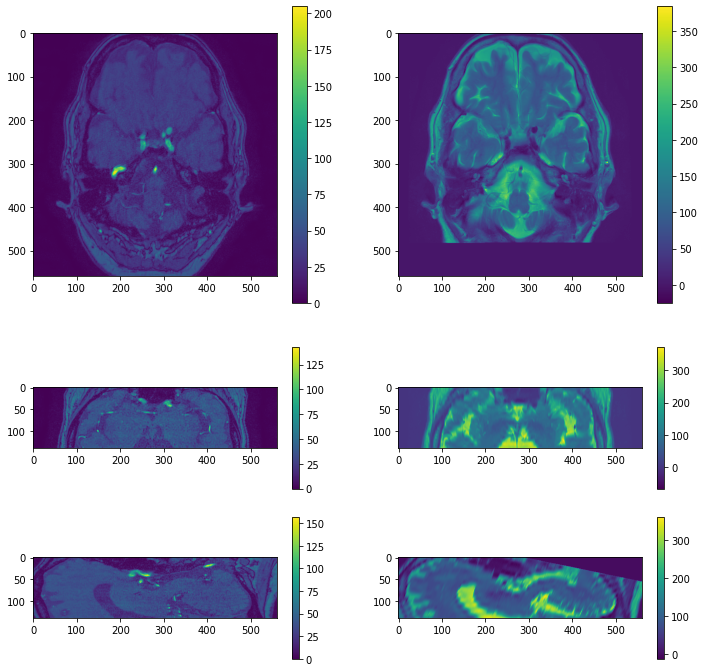

In [ ]:
input_tof_img_slice_np = sitk.GetArrayViewFromImage(input_tof_img_itk)
input_struct_img_slice_np = sitk.GetArrayViewFromImage(input_struct_img_itk)

plt.figure(figsize=(12, 12))
plt.subplot(2, 2, 1)
plt.imshow(input_tof_img_slice_np[ane_z,:,:])
plt.colorbar()

plt.subplot(2, 2, 2)
plt.imshow(input_struct_img_slice_np[ane_z,:,:])
plt.colorbar()

plt.subplot(4, 2, 5)
plt.imshow(input_tof_img_slice_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 2, 6)
plt.imshow(input_struct_img_slice_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 2, 7)
plt.imshow(input_tof_img_slice_np[:,:,ane_x])
plt.colorbar()

plt.subplot(4, 2, 8)
plt.imshow(input_struct_img_slice_np[:,:,ane_x])
plt.colorbar()

### Change inference parameter file

In [ ]:
[ckpt for ckpt in (project_path/'exp'/'GLIA-Net'/'1'/'ckpt').glob('*checkpoint*.pt')]

[PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0320281.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0369700.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0295421.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0245701.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/best_checkpoint-0.3670.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0345141.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0307851.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0245700.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0332711.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0369500.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0370000.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0369600.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-0369800.pt'),
 PosixPath('/home/GLIA-Net/exp/GLIA-Net/1/ckpt/checkpoint-03

In [ ]:
ckpt_list = [int(ckpt.name.replace('.pt', '').replace(r'checkpoint-', '')) for ckpt in (project_path/'exp'/'GLIA-Net'/'1'/'ckpt').glob('checkpoint*.pt')]
last_ckpt = max(ckpt_list)
last_ckpt

370000

In [ ]:
with open("configs/inference_GLIA-Net.yaml", 'r') as fr:
    lines = fr.readlines()

In [ ]:
print(f"checkpoint-{last_ckpt:07}.pt")

checkpoint-0370000.pt


In [ ]:
there_is_best = False
if [ckpt for ckpt in (project_path/'exp'/'GLIA-Net'/'1'/'ckpt').glob('best_checkpoint*.pt')]:
    best_ckpt_filename = f"best_checkpoint-{max([float(ckpt.name[len('best_checkpoint-'):-3]) for ckpt in (project_path/'exp'/'GLIA-Net'/'1'/'ckpt').glob('best_checkpoint*.pt')]):1.4f}.pt"
    there_is_best = True

In [ ]:
for i in range(len(lines)):
    if lines[i][:9] == 'ckpt_file':
        if there_is_best:
            lines[i] = f"ckpt_file: {best_ckpt_filename}  # ckpt file name to load. set null to load the latest ckpt"
        else:
            lines[i] = f"ckpt_file: checkpoint-{last_ckpt:07}.pt  # ckpt file name to load. set null to load the latest ckpt"

In [ ]:
for i in range(len(lines)):
    if lines[i][:9] == "ckpt_file":
        print(lines[i])

ckpt_file: best_checkpoint-0.3670.pt  # ckpt file name to load. set null to load the latest ckpt


In [ ]:
with open("configs/inference_GLIA-Net.yaml", 'w') as fw:
    for line in lines:
        fw.write(line)

In [ ]:
!cat configs/inference_GLIA-Net.yaml

task: AneurysmSeg
logging_folder: logs
ckpt_folder: ckpt
summary_folder: summary
load_best_model: False  # if false, load last. else load best checkpoint
ckpt_file: best_checkpoint-0.3670.pt  # ckpt file name to load. set null to load the latest ckpt
# will be sent to model as kwargs
model:
  filename: GLIA-Net
  classname: GLIANet
  with_global: True  # whether use global positioning network
  global_type: attention_map
  global_out_channels: 2
  in_channels: 1
  out_channels: 2
  num_classes: 2  # usually same to out_channels
  f_maps: [16, 32, 64, 128]
  norm_type: gn  # bn (batch norm), in (instance norm), gn (group norm) or sn (switchable norm)

data:
  features:
    tof_img_file: image
  normalization: z_norm
  hu_values: [[0, 100], [100, 200], [200, 800]]  # HU value intervals  for input images. Length should be same as in_channels
  img_spacing: [0.499999, 0.35714287, 0.35714287]  # set null if you don't want to change spacing. e.g. [0.5, 0.5, 0.5]
  patch_size: [96, 96, 96]  #

### Predict aneurysm mask

In [ ]:
!python inference.py \
    -c inference_GLIA-Net \
    -i /home/GLIA-Net/medical_data/tof_img/$VIS_EXAM,/home/GLIA-Net/medical_data/struct_img/$VIS_EXAM \
    -t nii \
    -p y -g y \
    -d 0 \
    -o /tmp/

2021-12-05 04:36:39 [MainThread] INFO [TaskAneurysmSegInferencer] - use device 0
2021-12-05 04:36:43 [MainThread] INFO [TaskAneurysmSegInferencer] - Checkpoint 'exp/GLIA-Net/1/ckpt/best_checkpoint-0.3670.pt' loaded
2021-12-05 04:36:43 [MainThread] INFO [TaskAneurysmSegInferencer] - Begin to scan input_folder_or_file ('/home/GLIA-Net/medical_data/tof_img/10063F.nii.gz', '/home/GLIA-Net/medical_data/struct_img/10063F.nii.gz')...
2021-12-05 04:36:46 [MainThread] INFO [TaskAneurysmSegInferencer] - inference instance 10063F.nii.gz (242 patches)...
	processing procedure: 0.0%tcmalloc: large alloc 1404928000 bytes == 0x563b471f8000 @  0x7f1531a0b001 0x7f152edb654f 0x7f152ee06b58 0x7f152ee0ab17 0x7f152eea9203 0x5639b9968544 0x5639b9968240 0x5639b99dc627 0x5639b99d69ee 0x5639b9969bda 0x5639b99dbd00 0x5639b99d69ee 0x5639b9969bda 0x5639b99d8737 0x5639b99d69ee 0x5639b9969bda 0x5639b99d8737 0x5639b99d6ced 0x5639b9969bda 0x5639b99d8737 0x5639b99d6ced 0x5639b9969bda 0x5639b99d8737 0x5639b99d6ced 0x56

### Visualize predicted aneurysm and ground truth mask 

In [ ]:
img_reader.SetFileName('/tmp/' + vis_exam)
pred_img_itk = img_reader.Execute()

print('Class                :', type(pred_img_itk))
print('Number of dimensions :', pred_img_itk.GetDimension())
print('Size                 :', pred_img_itk.GetSize())
print('Number of voxels     :', pred_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [ ]:
img_reader.SetFileName('/tmp/' + vis_prob_exam)
prob_img_itk = img_reader.Execute()

print('Class                :', type(prob_img_itk))
print('Number of dimensions :', prob_img_itk.GetDimension())
print('Size                 :', prob_img_itk.GetSize())
print('Number of voxels     :', prob_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [ ]:
if with_global:
    img_reader.SetFileName('/tmp/' + vis_global_exam)
    global_img_itk = img_reader.Execute()

    print('Class                :', type(global_img_itk))
    print('Number of dimensions :', global_img_itk.GetDimension())
    print('Size                 :', global_img_itk.GetSize())
    print('Number of voxels     :', global_img_itk.GetNumberOfPixels())

Class                : <class 'SimpleITK.SimpleITK.Image'>
Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


In [ ]:
img_reader.SetFileName((dataset_annotation_path / vis_exam).absolute().as_posix())
true_img_itk = img_reader.Execute()

print('Number of dimensions :', true_img_itk.GetDimension())
print('Size                 :', true_img_itk.GetSize())
print('Number of voxels     :', true_img_itk.GetNumberOfPixels())

Number of dimensions : 3
Size                 : (560, 560, 140)
Number of voxels     : 43904000


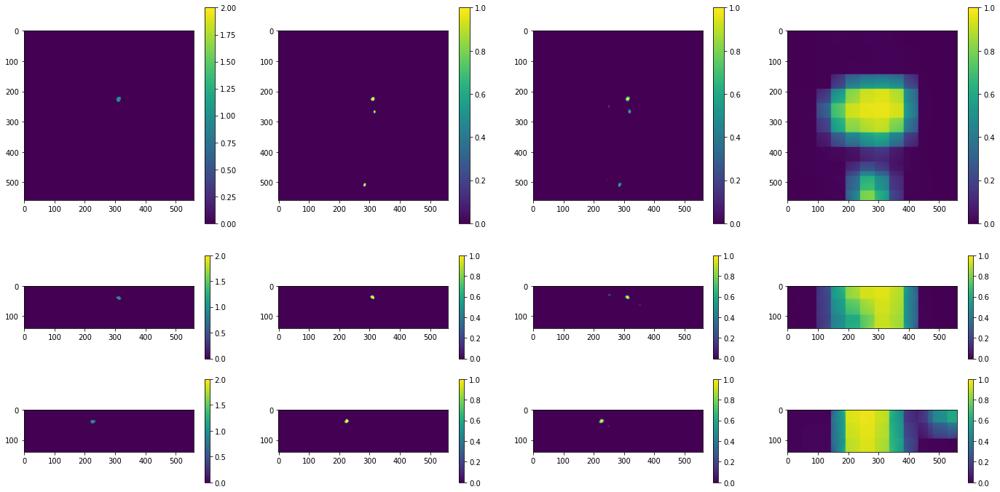

In [ ]:
true_img_np = sitk.GetArrayViewFromImage(true_img_itk)
pred_img_np = sitk.GetArrayViewFromImage(pred_img_itk)
prob_img_np = sitk.GetArrayViewFromImage(prob_img_itk)
if with_global:
    global_img_np = sitk.GetArrayViewFromImage(global_img_itk)

plt.figure(figsize=(24, 12))
plt.subplot(2, 4, 1)
plt.imshow(true_img_np[ane_z,:,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(2, 4, 2)
plt.imshow(pred_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(2, 4, 3)
plt.imshow(prob_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(2, 4, 4)
    plt.imshow(global_img_np[ane_z,:,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 4, 9)
plt.imshow(true_img_np[:,ane_y,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 4, 10)
plt.imshow(pred_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 4, 11)
plt.imshow(prob_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 4, 12)
    plt.imshow(global_img_np[:,ane_y,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 4, 13)
plt.imshow(true_img_np[:,:,ane_x], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 4, 14)
plt.imshow(pred_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 4, 15)
plt.imshow(prob_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 4, 16)
    plt.imshow(global_img_np[:,:,ane_x], vmin=0, vmax=1)
    plt.colorbar()

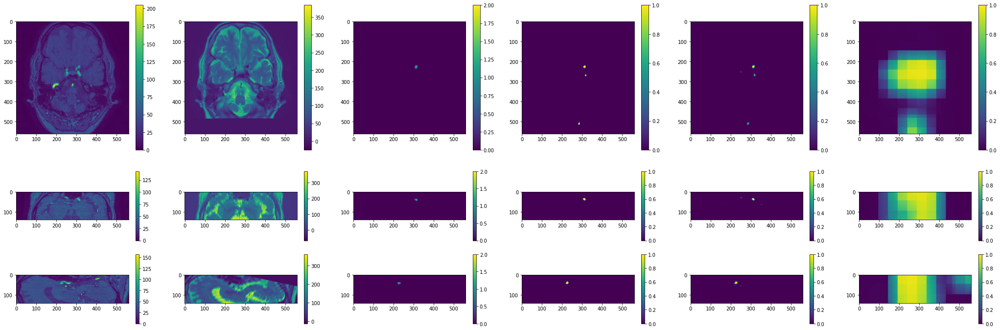

In [ ]:
input_tof_img_np = sitk.GetArrayViewFromImage(input_tof_img_itk)
input_struct_img_np = sitk.GetArrayViewFromImage(input_struct_img_itk)
pred_img_np = sitk.GetArrayViewFromImage(pred_img_itk)
true_img_np = sitk.GetArrayViewFromImage(true_img_itk)

plt.figure(figsize=(36, 12))
plt.subplot(2, 6, 1)
plt.imshow(input_tof_img_np[ane_z,:,:])
plt.colorbar()

plt.subplot(2, 6, 2)
plt.imshow(input_struct_img_np[ane_z,:,:])
plt.colorbar()

plt.subplot(2, 6, 3)
plt.imshow(true_img_np[ane_z,:,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(2, 6, 4)
plt.imshow(pred_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(2, 6, 5)
plt.imshow(prob_img_np[ane_z,:,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(2, 6, 6)
    plt.imshow(global_img_np[ane_z,:,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 6, 13)
plt.imshow(input_tof_img_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 6, 14)
plt.imshow(input_struct_img_np[:,ane_y,:])
plt.colorbar()

plt.subplot(4, 6, 15)
plt.imshow(true_img_np[:,ane_y,:], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 6, 16)
plt.imshow(pred_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 6, 17)
plt.imshow(prob_img_np[:,ane_y,:], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 6, 18)
    plt.imshow(global_img_np[:,ane_y,:], vmin=0, vmax=1)
    plt.colorbar()

plt.subplot(4, 6, 19)
plt.imshow(input_tof_img_np[:,:,ane_x])
plt.colorbar()

plt.subplot(4, 6, 20)
plt.imshow(input_struct_img_np[:,:,ane_x])
plt.colorbar()

plt.subplot(4, 6, 21)
plt.imshow(true_img_np[:,:,ane_x], vmin=0, vmax=2)
plt.colorbar()

plt.subplot(4, 6, 22)
plt.imshow(pred_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

plt.subplot(4, 6, 23)
plt.imshow(prob_img_np[:,:,ane_x], vmin=0, vmax=1)
plt.colorbar()

if with_global:
    plt.subplot(4, 6, 24)
    plt.imshow(global_img_np[:,:,ane_x], vmin=0, vmax=1)
    plt.colorbar()

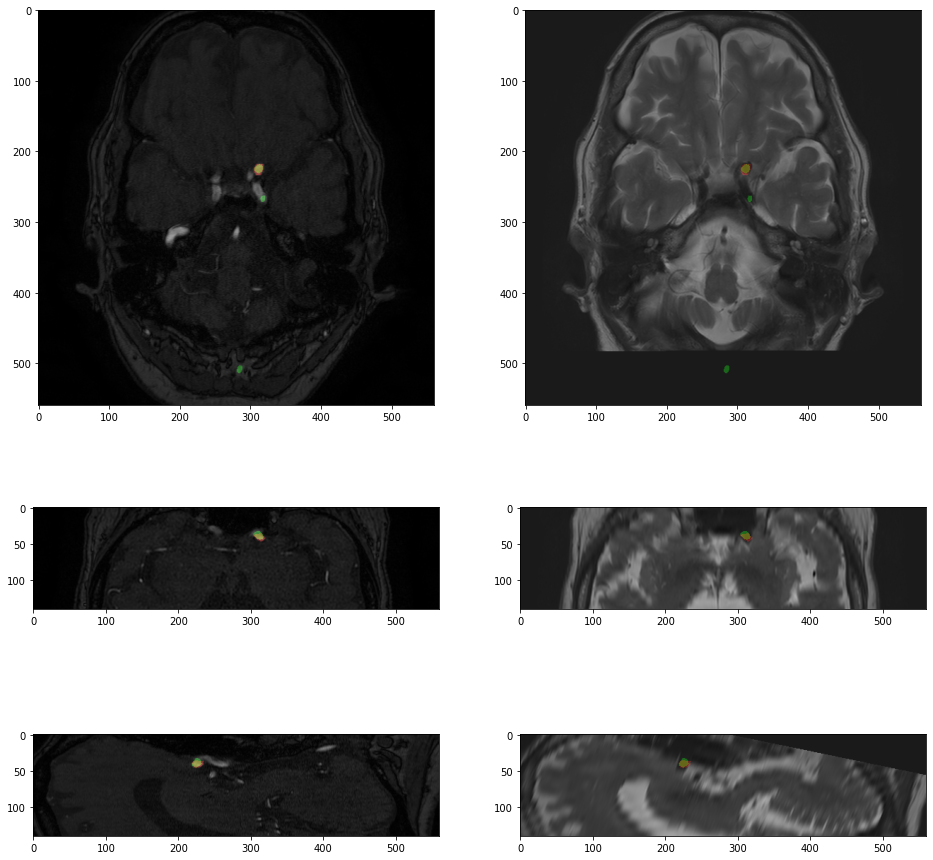

In [ ]:
tof_res_img_np = np.stack([input_tof_img_np, input_tof_img_np, input_tof_img_np], -1)
struct_res_img_np = np.stack([input_struct_img_np, input_struct_img_np, input_struct_img_np], -1)

tof_res_img_np = (tof_res_img_np - np.min(tof_res_img_np)) / (np.max(tof_res_img_np) - np.min(tof_res_img_np))
struct_res_img_np = (struct_res_img_np - np.min(struct_res_img_np)) / (np.max(struct_res_img_np) - np.min(struct_res_img_np))

tof_res_img_np = (1 - alpha_vis) * tof_res_img_np
struct_res_img_np = (1 - alpha_vis) * struct_res_img_np

tof_res_img_np[:,:,:,0] = tof_res_img_np[:,:,:,0] + alpha_vis * true_img_np
struct_res_img_np[:,:,:,0] = struct_res_img_np[:,:,:,0] + alpha_vis * true_img_np

tof_res_img_np[:,:,:,1] = tof_res_img_np[:,:,:,1] + alpha_vis * pred_img_np
struct_res_img_np[:,:,:,1] = struct_res_img_np[:,:,:,1] + alpha_vis * pred_img_np

plt.figure(figsize=(16, 16))
plt.subplot(2, 2, 1)
plt.imshow(tof_res_img_np[ane_z,:,:,:])

plt.subplot(2, 2, 2)
plt.imshow(struct_res_img_np[ane_z,:,:,:])

plt.subplot(4, 2, 5)
plt.imshow(tof_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 6)
plt.imshow(struct_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 7)
plt.imshow(tof_res_img_np[:,:,ane_x,:])

plt.subplot(4, 2, 8)
plt.imshow(struct_res_img_np[:,:,ane_x,:])

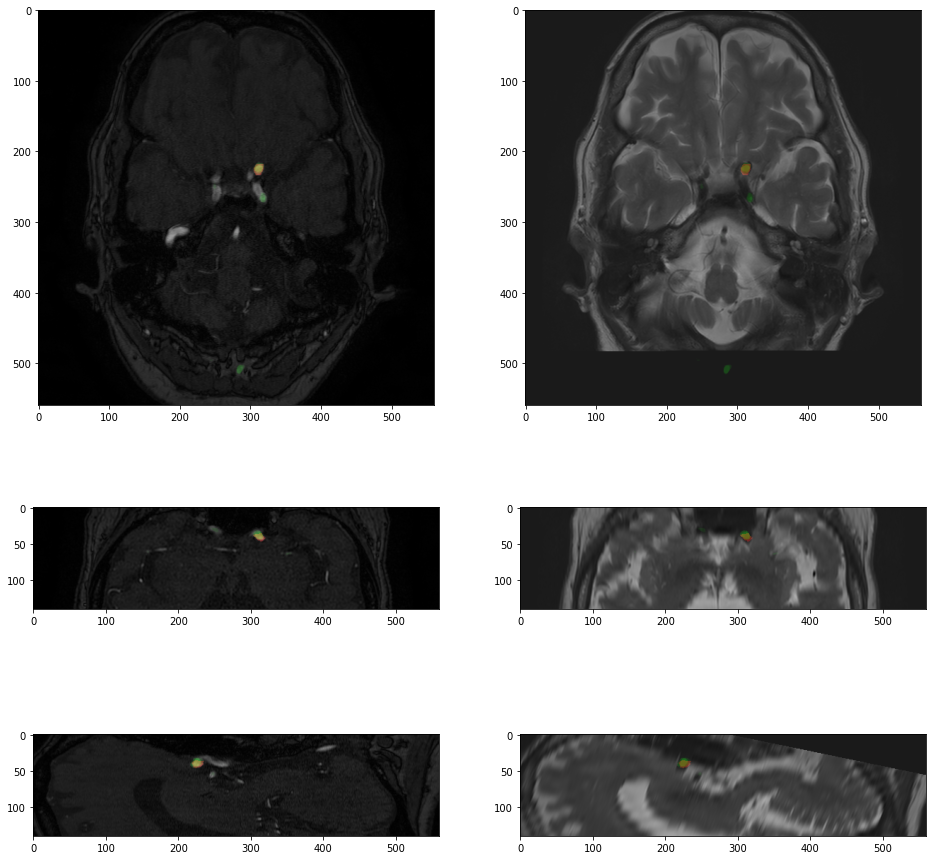

In [ ]:
tof_res_img_np = np.stack([input_tof_img_np, input_tof_img_np, input_tof_img_np], -1)
struct_res_img_np = np.stack([input_struct_img_np, input_struct_img_np, input_struct_img_np], -1)

tof_res_img_np = (tof_res_img_np - np.min(tof_res_img_np)) / (np.max(tof_res_img_np) - np.min(tof_res_img_np))
struct_res_img_np = (struct_res_img_np - np.min(struct_res_img_np)) / (np.max(struct_res_img_np) - np.min(struct_res_img_np))

tof_res_img_np = (1 - alpha_vis) * tof_res_img_np
struct_res_img_np = (1 - alpha_vis) * struct_res_img_np

tof_res_img_np[:,:,:,0] = tof_res_img_np[:,:,:,0] + alpha_vis * true_img_np
struct_res_img_np[:,:,:,0] = struct_res_img_np[:,:,:,0] + alpha_vis * true_img_np

tof_res_img_np[:,:,:,1] = tof_res_img_np[:,:,:,1] + alpha_vis * prob_img_np
struct_res_img_np[:,:,:,1] = struct_res_img_np[:,:,:,1] + alpha_vis * prob_img_np

plt.figure(figsize=(16, 16))
plt.subplot(2, 2, 1)
plt.imshow(tof_res_img_np[ane_z,:,:,:])

plt.subplot(2, 2, 2)
plt.imshow(struct_res_img_np[ane_z,:,:,:])

plt.subplot(4, 2, 5)
plt.imshow(tof_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 6)
plt.imshow(struct_res_img_np[:,ane_y,:,:])

plt.subplot(4, 2, 7)
plt.imshow(tof_res_img_np[:,:,ane_x,:])

plt.subplot(4, 2, 8)
plt.imshow(struct_res_img_np[:,:,ane_x,:])

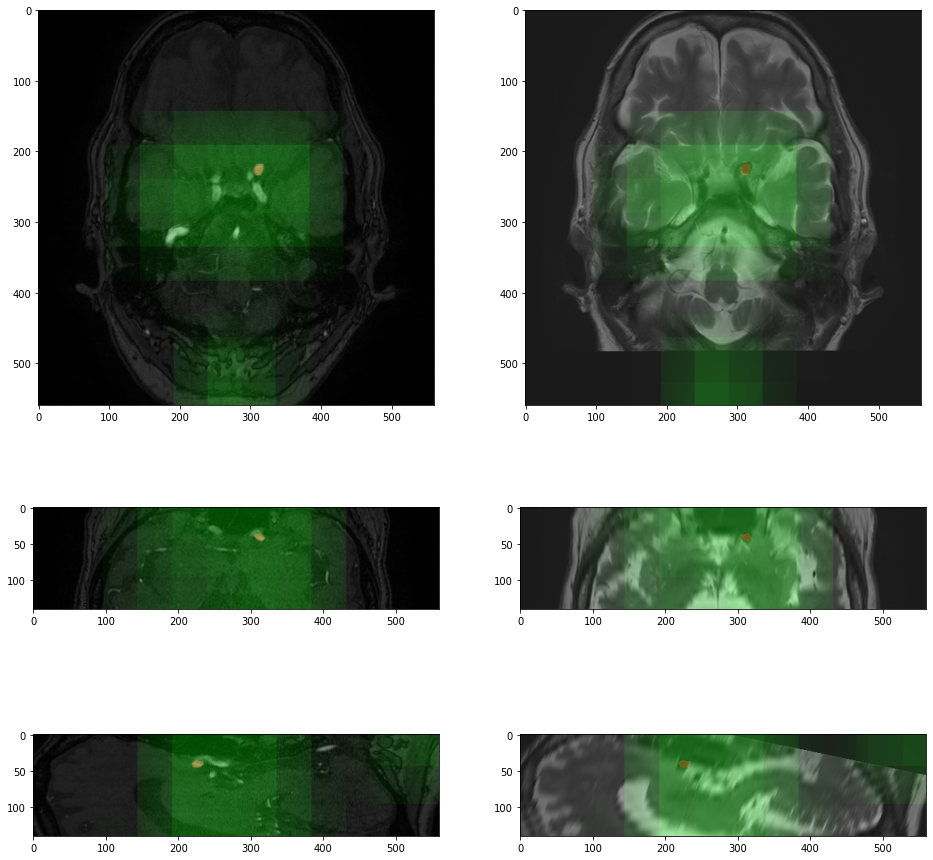

In [ ]:
if with_global:
    tof_res_img_np = np.stack([input_tof_img_np, input_tof_img_np, input_tof_img_np], -1)
    struct_res_img_np = np.stack([input_struct_img_np, input_struct_img_np, input_struct_img_np], -1)

    tof_res_img_np = (tof_res_img_np - np.min(tof_res_img_np)) / (np.max(tof_res_img_np) - np.min(tof_res_img_np))
    struct_res_img_np = (struct_res_img_np - np.min(struct_res_img_np)) / (np.max(struct_res_img_np) - np.min(struct_res_img_np))

    tof_res_img_np = (1 - alpha_vis) * tof_res_img_np
    struct_res_img_np = (1 - alpha_vis) * struct_res_img_np

    tof_res_img_np[:,:,:,0] = tof_res_img_np[:,:,:,0] + alpha_vis * true_img_np
    struct_res_img_np[:,:,:,0] = struct_res_img_np[:,:,:,0] + alpha_vis * true_img_np

    tof_res_img_np[:,:,:,1] = tof_res_img_np[:,:,:,1] + alpha_vis * global_img_np
    struct_res_img_np[:,:,:,1] = struct_res_img_np[:,:,:,1] + alpha_vis * global_img_np

    plt.figure(figsize=(16, 16))
    plt.subplot(2, 2, 1)
    plt.imshow(tof_res_img_np[ane_z,:,:,:])

    plt.subplot(2, 2, 2)
    plt.imshow(struct_res_img_np[ane_z,:,:,:])

    plt.subplot(4, 2, 5)
    plt.imshow(tof_res_img_np[:,ane_y,:,:])

    plt.subplot(4, 2, 6)
    plt.imshow(struct_res_img_np[:,ane_y,:,:])

    plt.subplot(4, 2, 7)
    plt.imshow(tof_res_img_np[:,:,ane_x,:])

    plt.subplot(4, 2, 8)
    plt.imshow(struct_res_img_np[:,:,ane_x,:])

## ADAM Challenge Evaluation Statistics

### Inference all evaluation images

In [125]:
!python inference.py \
    -c inference_GLIA-Net \
    -i /home/GLIA-Net/medical_data/tof_img,/home/GLIA-Net/medical_data/struct_img \
    -t nii \
    -p n -g n \
    -d 0 \
    -o /home/GLIA-Net/medical_data/output

2021-12-07 11:45:16 [MainThread] INFO [TaskAneurysmSegInferencer] - use device 0
2021-12-07 11:45:19 [MainThread] INFO [TaskAneurysmSegInferencer] - Checkpoint 'exp/GLIA-Net/1/ckpt/best_checkpoint-0.3670.pt' loaded
2021-12-07 11:45:19 [MainThread] INFO [TaskAneurysmSegInferencer] - Begin to scan input_folder_or_file ('/home/GLIA-Net/medical_data/tof_img', '/home/GLIA-Net/medical_data/struct_img')...
tcmalloc: large alloc 1204224000 bytes == 0x5615f625a000 @  0x7f4b794d61e7 0x7f4b7688346e 0x7f4b768d3c7b 0x7f4b768d6e83 0x7f4b768d707b 0x7f4b76978761 0x56145f3b14b0 0x56145f3b1240 0x56145f4250f3 0x56145f41fced 0x56145f3b2bda 0x56145f421737 0x56145f41fced 0x56145f3b2bda 0x56145f420915 0x56145f41fced 0x56145f3b2bda 0x56145f424d00 0x56145f41f9ee 0x56145f3b2bda 0x56145f421737 0x56145f41fced 0x56145f3b2bda 0x56145f420c0d 0x56145f3b2afa 0x56145f420c0d 0x56145f3b2afa 0x56145f420915 0x56145f41f9ee 0x56145f41f6f3 0x56145f4e94c2
tcmalloc: large alloc 1342177280 bytes == 0x56163deca000 @  0x7f4b794d80

In [126]:
!echo tof_img $(ls /home/GLIA-Net/medical_data/tof_img | wc -l)
!echo struct_img $(ls /home/GLIA-Net/medical_data/struct_img | wc -l)
!echo output $(ls /home/GLIA-Net/medical_data/output | wc -l)
!echo ane_seg $(ls /home/GLIA-Net/medical_data/ane_seg | wc -l)

tof_img 113
struct_img 113
output 339
ane_seg 113


In [127]:
!ls /home/GLIA-Net/medical_data/output

10001_global.nii.gz  10038_prob.nii.gz	   10060B.nii.gz
10001.nii.gz	     10039_global.nii.gz   10060B_prob.nii.gz
10001_prob.nii.gz    10039.nii.gz	   10060F_global.nii.gz
10002_global.nii.gz  10039_prob.nii.gz	   10060F.nii.gz
10002.nii.gz	     10040_global.nii.gz   10060F_prob.nii.gz
10002_prob.nii.gz    10040.nii.gz	   10061B_global.nii.gz
10003_global.nii.gz  10040_prob.nii.gz	   10061B.nii.gz
10003.nii.gz	     10041_global.nii.gz   10061B_prob.nii.gz
10003_prob.nii.gz    10041.nii.gz	   10061F_global.nii.gz
10004_global.nii.gz  10041_prob.nii.gz	   10061F.nii.gz
10004.nii.gz	     10042_global.nii.gz   10061F_prob.nii.gz
10004_prob.nii.gz    10042.nii.gz	   10062B_global.nii.gz
10005_global.nii.gz  10042_prob.nii.gz	   10062B.nii.gz
10005.nii.gz	     10043_global.nii.gz   10062B_prob.nii.gz
10005_prob.nii.gz    10043.nii.gz	   10062F_global.nii.gz
10006_global.nii.gz  10043_prob.nii.gz	   10062F.nii.gz
10006.nii.gz	     10044B_global.nii.gz  10062F_prob.nii.gz
10006_prob.nii.gz   

### Segmentation and Detection Tasks

In [ ]:
!python evaluation_segmentation.py > /home/GLIA-Net/exp/GLIA-Net/1/logs/evaluation_segmentation.txt

In [ ]:
!cat /home/GLIA-Net/exp/GLIA-Net/1/logs/evaluation_segmentation.txt

1 exam 10062B : DSC=0.008 HD=70.298 VS=0.287 sensitivity=1.000 FPs/exam=13
2 exam 10040 : DSC=0.000 HD=47.074 VS=0.275 sensitivity=0.000 FPs/exam=15
3 exam 10021 : DSC=0.000 HD=97.291 VS=0.649 sensitivity=0.000 FPs/exam=28
ERROR: not enough values to unpack (expected 2, got 1)
4 exam 10003 : DSC=0.000 HD=nan VS=0.000 sensitivity=nan FPs/exam=24
ERROR: not enough values to unpack (expected 2, got 1)
5 exam 10010 : DSC=0.000 HD=nan VS=0.000 sensitivity=nan FPs/exam=13
6 exam 10075F : DSC=0.000 HD=62.990 VS=0.680 sensitivity=0.000 FPs/exam=8
7 exam 10035 : DSC=0.340 HD=57.432 VS=0.515 sensitivity=1.000 FPs/exam=20
8 exam 10052F : DSC=0.000 HD=63.860 VS=0.946 sensitivity=0.000 FPs/exam=11
ERROR: not enough values to unpack (expected 2, got 1)
9 exam 10005 : DSC=0.000 HD=nan VS=0.000 sensitivity=nan FPs/exam=12
10 exam 10063F : DSC=0.480 HD=99.281 VS=0.886 sensitivity=1.000 FPs/exam=10
11 exam 10044B : DSC=0.000 HD=49.909 VS=0.308 sensitivity=0.000 FPs/exam=6
12 exam 10022 : DSC=0.019 HD=46

In [ ]:
# !python evaluation_detection.py # unsupported

In [ ]:
shutil.copytree(dataset_output_path, output_drive_path)

PosixPath('/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/output')

In [ ]:
shutil.copytree(dataset_annotation_path, annotation_drive_path)

PosixPath('/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/ane_seg')

In [128]:
!date "+%T"

16:23:38


In [129]:
#!python optimize_performance_full_img.py --nb_threshold 100 --threshold_sampling linspace

Number of thresholds = 100
iter 0
---OVERALL STATISTICS 0.0 % threshold=0.010 ---
Dice: 0.049 (higher is better, min=0, max=1)
HD: 79.384 mm (lower is better, min=0, max=+inf)
VS: 0.066 (higher is better, min=0, max=1)
Sensitivity: 0.605 (higher is better, min=0, max=1)
False Positive Count: 125.0 (lower is better, min=0, max=+inf)
iter 1
iter 2
iter 3
iter 4
iter 5
iter 6
iter 7
iter 8
iter 9
iter 10
---OVERALL STATISTICS 10.0 % threshold=0.109 ---
Dice: 0.068 (higher is better, min=0, max=1)
HD: 70.057 mm (lower is better, min=0, max=+inf)
VS: 0.108 (higher is better, min=0, max=1)
Sensitivity: 0.658 (higher is better, min=0, max=1)
False Positive Count: 70.8 (lower is better, min=0, max=+inf)
iter 11
iter 12
iter 13
iter 14
iter 15
iter 16
iter 17
iter 18
iter 19
iter 20
---OVERALL STATISTICS 20.0 % threshold=0.208 ---
Dice: 0.081 (higher is better, min=0, max=1)
HD: 70.424 mm (lower is better, min=0, max=+inf)
VS: 0.187 (higher is better, min=0, max=1)
Sensitivity: 0.684 (higher is

In [130]:
!date "+%T"

23:49:27


In [ ]:
!ls exp/GLIA-Net/1/logs

2021-12-04#06-47-24.log  2021-12-04#20-57-04.log  2021-12-04#21-20-38.log
2021-12-04#06-47-39.log  2021-12-04#20-57-37.log  2021-12-04#21-25-08.log
2021-12-04#06-49-59.log  2021-12-04#20-57-50.log  evaluation_segmentation.txt


## Test per patch

In [ ]:
!python evaluate.py -c eval_GLIA-Net

2021-12-05 05:03:01 [MainThread] INFO [TaskAneurysmSegEvaler] - use device 0
2021-12-05 05:03:01 [MainThread] INFO [TaskAneurysmSegEvaler] - Seed the RNG for all devices with 12345
2021-12-05 05:03:01 [MainThread] INFO [TaskAneurysmSegEvaler] - The eval TaskListProducer will read 23 files with 1 workers for eval
2021-12-05 05:03:05 [MainThread] ERROR [TaskAneurysmSegEvaler] - [Errno 2] No such file or directory: 'exp/GLIA-Net/1/ckpt/checkpoint-0357571.pt'
Traceback (most recent call last):
  File "evaluate.py", line 58, in <module>
    eval(config, exp_path, logger, devices)
  File "evaluate.py", line 39, in eval
    evaler = Evaler(config, exp_path, devices, eval_loader, logger=logger)
  File "/home/GLIA-Net/core.py", line 1172, in __init__
    super(Evaler, self).__init__(config, exp_path, devices, eval_loader=eval_loader, logger=logger)
  File "/home/GLIA-Net/core.py", line 562, in __init__
    self._load_checkpoint(ckpt_file=config['ckpt_file'])
  File "/home/GLIA-Net/core.py", lin

## Test per exam

In [ ]:
!python evaluate_per_case.py \
    -c eval_per_case \
    -g medical_data/ane_seg \
    -p medical_data/ane_seg

2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - use device 0
2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - gt_file_or_folder: medical_data/ane_seg
2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - pred_file_or_folder: medical_data/ane_seg
2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - mask or probability distribution: mask
2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - Begin to scan gt_folder_or_file medical_data/ane_seg...
2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - Begin to scan pred_folder_or_file medical_data/ane_seg...
2021-12-05 04:06:52 [MainThread] INFO [StudyEvaluater] - instance number: 114. start evaluating...
2021-12-05 04:06:58 [MainThread] INFO [StudyEvaluater] - (2 in 114) 10001:	per_target_precision: 0.5000	per_target_recall: 0.5000	per_target_tp: 0	per_target_fp: 0	per_target_fn: 0
2021-12-05 04:07:00 [MainThread] INFO [StudyEvaluater] - (3 in 114) 10002:	per_target_precision: 0.5000	per_target_recall: 0.5000	

In [ ]:
!python evaluate_per_case.py \
    -c eval_per_case \
    -g medical_data/ane_seg \
    -p medical_data/output

2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - use device 0
2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - gt_file_or_folder: medical_data/ane_seg
2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - pred_file_or_folder: medical_data/output
2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - mask or probability distribution: mask
2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - Begin to scan gt_folder_or_file medical_data/ane_seg...
2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - Begin to scan pred_folder_or_file medical_data/output...
2021-12-05 04:10:23 [MainThread] INFO [StudyEvaluater] - instance number: 114. start evaluating...
2021-12-05 04:10:29 [MainThread] INFO [StudyEvaluater] - (2 in 114) 10001:	per_target_precision: 0.0000	per_target_recall: 0.5000	per_target_tp: 0	per_target_fp: 6	per_target_fn: 0
2021-12-05 04:10:31 [MainThread] INFO [StudyEvaluater] - (3 in 114) 10002:	per_target_precision: 0.0000	per_target_recall: 0.5000	pe

## Send logs, checkpoints and summary to Drive

### Visualize logs, checkpoints and summary

In [ ]:
!ls exp/GLIA-Net/1

ckpt  logs  summary


In [ ]:
!ls exp/GLIA-Net/1/ckpt

best_checkpoint-0.3670.pt  checkpoint-0320281.pt  checkpoint-0369700.pt
checkpoint-0245700.pt	   checkpoint-0332711.pt  checkpoint-0369800.pt
checkpoint-0245701.pt	   checkpoint-0345141.pt  checkpoint-0369900.pt
checkpoint-0295421.pt	   checkpoint-0369500.pt  checkpoint-0370000.pt
checkpoint-0307851.pt	   checkpoint-0369600.pt


In [ ]:
!ls exp/GLIA-Net/1/logs

2021-12-04#06-47-24.log  2021-12-04#20-57-04.log  evaluation_segmentation.txt
2021-12-04#06-47-39.log  2021-12-04#20-57-37.log
2021-12-04#06-49-59.log  2021-12-04#20-57-50.log


In [ ]:
!cat $(find exp/GLIA-Net/1/logs -name "????-??-??#??-??-??.log" | sort)

2021-12-04 06:47:24 [MainThread] INFO [TaskAneurysmSegTransfer] - use device 0
2021-12-04 06:47:28 [MainThread] INFO [TaskAneurysmSegTransfer] - Checkpoint 'exp/GLIA-Net/1/ckpt/checkpoint-0245700.pt' loaded
2021-12-04 06:47:28 [MainThread] INFO [TaskAneurysmSegTransfer] - Latest checkpoint saved to 'exp/GLIA-Net/1/ckpt/checkpoint-0245701.pt'
2021-12-04 06:47:39 [MainThread] INFO [TaskAneurysmSegInferencer] - use device 0
2021-12-04 06:47:43 [MainThread] INFO [TaskAneurysmSegInferencer] - Checkpoint 'exp/GLIA-Net/1/ckpt/checkpoint-0357571.pt' loaded
2021-12-04 06:47:43 [MainThread] INFO [TaskAneurysmSegInferencer] - Begin to scan input_folder_or_file ('/home/GLIA-Net/medical_data/tof_img/10074F.nii.gz', '/home/GLIA-Net/medical_data/struct_img/10074F.nii.gz')...
2021-12-04 06:47:46 [MainThread] INFO [TaskAneurysmSegInferencer] - inference instance 10074F.nii.gz (242 patches)...
2021-12-04 06:49:35 [MainThread] INFO [TaskAneurysmSegInferencer] - finish 1 in 1 instances
2021-12-04 06:50:00

In [ ]:
!ls exp/GLIA-Net/1/summary

events.out.tfevents.1638600448.ad7caf9b069d
events.out.tfevents.1638600462.ad7caf9b069d
events.out.tfevents.1638600603.ad7caf9b069d
events.out.tfevents.1638651432.ad7caf9b069d
events.out.tfevents.1638651461.ad7caf9b069d
events.out.tfevents.1638651474.ad7caf9b069d


### Upload

In [ ]:
if(log_ckpt_drive_path.exists()):
    shutil.rmtree(log_ckpt_drive_path)

In [ ]:
shutil.copytree(log_ckpt_path, log_ckpt_drive_path)

NotADirectoryError: ignored

In [ ]:
shutil.copy(ane_seg_csv_path, ane_seg_csv_drive_path)

PosixPath('/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/aneurysm_seg.csv')

In [ ]:
if dataset_output_path.exists:
    shutil.copytree(dataset_output_path, output_drive_path)

### Verify upload

In [ ]:
if log_ckpt_drive_path.exists():
    print_tree(log_ckpt_drive_path)

/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary/events.out.tfevents.1638600462.ad7caf9b069d
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary/events.out.tfevents.1638651461.ad7caf9b069d
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary/events.out.tfevents.1638651432.ad7caf9b069d
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary/events.out.tfevents.1638600448.ad7caf9b069d
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary/events.out.tfevents.1638600603.ad7caf9b069d
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/summary/events.out.tfevents.1638651474.ad7caf9b069d
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/ckpt
/gdrive/MyDrive/Poli/Poli 2021/TCC2/ADAM/../GLIA_Net_ADAM_result/ckpt/checkpoint-0320281.p

## TensorBoard

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pwd

/home/GLIA-Net


In [ ]:
#!rm -rf exp/GLIA-Net/1

In [ ]:
#shutil.copytree(log_ckpt_drive_path, log_ckpt_path)

PosixPath('/home/GLIA-Net/exp/GLIA-Net/1')

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir=exp/

<IPython.core.display.Javascript object>

# Test Anything

In [ ]:
!ls

analyze_performance.py		   exp
artworks			   freeze_example.py
configs				   inference.py
core.py				   medical_data
data_loader.py			   model
draft_2.py			   optimize_performance_full_img.py
draft_4.py			   __pycache__
draft_optimization_performance.py  readme.md
draft_verify_loss.py		   refine_segmentation.py
evaluate_per_case.py		   train.py
evaluate.py			   transfer_model.py
evaluation_detection.py		   utils
evaluation_segmentation.py


In [ ]:
for i in (project_path / 'medical_data').glob('*'):
    print(i)

/home/GLIA-Net/medical_data/ane_seg
/home/GLIA-Net/medical_data/readme.md
/home/GLIA-Net/medical_data/struct_img
/home/GLIA-Net/medical_data/location
/home/GLIA-Net/medical_data/cta_img
/home/GLIA-Net/medical_data/tof_img
/home/GLIA-Net/medical_data/aneurysm_seg.csv


In [ ]:
shutil.copytree(drive_GLIA_Net_path / '..' / 'GLIA_Net_ADAM_result' / 'output', project_path / 'medical_data' / 'output')

PosixPath('/home/GLIA-Net/medical_data/output')

In [ ]:
!rm optimize_performance_full_img.py
shutil.copy2(drive_GLIA_Net_path / 'optimize_performance_full_img.py', project_path)

'/home/GLIA-Net/optimize_performance_full_img.py'

In [ ]:
!rm evaluation_segmentation.py
shutil.copy2(drive_GLIA_Net_path / 'evaluation_segmentation.py', project_path)

'/home/GLIA-Net/evaluation_segmentation.py'

In [131]:
shutil.copy2(project_path / 'metrics_per_voxel.png', drive_GLIA_Net_path)
shutil.copy2(project_path / 'metrics_per_target.png', drive_GLIA_Net_path)

'/gdrive/MyDrive/Poli/Poli 2021/TCC2/GLIA-Net/metrics_per_target.png'

In [ ]:
import logging
import copy
import SimpleITK as sitk

from utils.project_utils import load_config, get_devices, get_logger
from core import Inferencer, _ModelCore
from data_loader import AneurysmSegDataset, TaskListQueue

In [ ]:
!nvidia-smi

In [ ]:
exp_path = 'exp/GLIA-Net/1'
config = load_config('configs/GLIA-Net.yaml')
logger = get_logger('TaskAneurysmSegInferencer', None, 1)
devices = get_devices('0', logger)

In [ ]:
!ls exp/GLIA-Net/1/ckpt

In [ ]:
config['ckpt_file'] = 'checkpoint-0245701.pt'

In [ ]:
config['ckpt_file'] = get_last_checkpoint()

In [ ]:
config

In [ ]:
queue = TaskListQueue(config, 'train', logger, config['data']['train_num_file'], True)

In [ ]:
dataset = AneurysmSegDataset(config, 'train', queue, logger)

In [ ]:
data = next(iter(dataset))[0]

In [ ]:
list(data.keys())

In [ ]:
for key, value in data.items():
    print(key, value.shape)

In [ ]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 3, 1)
plt.imshow(data['tof_img'][48,:,:])

plt.subplot(2, 3, 2)
plt.imshow(data['tof_img'][:,48,:])

plt.subplot(2, 3, 3)
plt.imshow(data['tof_img'][:,:,48])

plt.subplot(2, 3, 4)
plt.imshow(data['struct_img'][48,:,:])

plt.subplot(2, 3, 5)
plt.imshow(data['struct_img'][:,48,:])

plt.subplot(2, 3, 6)
plt.imshow(data['struct_img'][:,:,48])

In [ ]:
plt.figure(figsize=(8, 4))
plt.subplot(1, 3, 1)
plt.imshow(data['brain_mask'][48,:,:])
plt.colorbar()

plt.subplot(1, 3, 2)
plt.imshow(data['brain_mask'][:,48,:])
plt.colorbar()

plt.subplot(1, 3, 3)
plt.imshow(data['brain_mask'][:,:,48])
plt.colorbar()

In [ ]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 3, 1)
plt.imshow(data['global_tof_img'][48,:,:])

plt.subplot(2, 3, 2)
plt.imshow(data['global_tof_img'][:,48,:])

plt.subplot(2, 3, 3)
plt.imshow(data['global_tof_img'][:,:,48])

plt.subplot(2, 3, 4)
plt.imshow(data['global_struct_img'][48,:,:])

plt.subplot(2, 3, 5)
plt.imshow(data['global_struct_img'][:,48,:])

plt.subplot(2, 3, 6)
plt.imshow(data['global_struct_img'][:,:,48])

In [ ]:
data['global_patch_location_bbox']

In [ ]:
model_core = _ModelCore(config, exp_path, devices)

In [ ]:
model_core._load_checkpoint(config['ckpt_file'])

In [ ]:
model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.conv1

In [ ]:
getattr(model_core.model.global_localizer.feature_generator, 'encode_block' + str(5)).residual_block1.conv1

In [ ]:
len(model_core.model.encoder_blocks)

In [ ]:
len(model_core.model.global_localizer.feature_generator)

In [ ]:
model_core.model.localizer_adaptor[0]

In [ ]:
model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.conv1.in_channels

In [ ]:
model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.conv1.out_channels

In [ ]:
model_core.model.encoder_blocks[0].residual_block1.conv1.in_channels

In [ ]:
model_core.model.encoder_blocks[0].residual_block1.conv1.out_channels

In [ ]:
for i, params in enumerate(model_core.model.encoder_blocks[0].residual_block1.parameters()):
    print(i, params.shape)

In [ ]:
model_core.model.encoder_blocks[0].residual_block1.conv1

In [ ]:
model_core.model.encoder_blocks[0].residual_block1.res_conv

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()).shape

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()).shape

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()).to('cpu').detach().numpy().reshape(8,2)

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv3.parameters()).to('cpu').detach().numpy().reshape(16, 8)

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()).to('cpu').detach().numpy().reshape(8,2)

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv3.parameters()).to('cpu').detach().numpy().reshape(16, 8)

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv3.parameters()).requires_grad

In [ ]:
model_core.model.encoder_blocks[0].residual_block1.conv1 = torch.nn.Conv3d(2, 8, 1, padding=0, bias=False)

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()).shape

In [ ]:
next(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()).to('cpu').detach().numpy().reshape(8,2)

In [ ]:
model_core.model.encoder_blocks[0].residual_block1.conv1

In [ ]:
model_core.model

In [ ]:
type(next(model_core.model.parameters()))

In [ ]:
next(model_core.model.parameters())

In [ ]:
torch.Size((8,2,1,1,1))

In [ ]:
for i, params in enumerate(model_core.model.parameters()):
    print(i, params.shape)
    params.requires_grad = True

In [ ]:
for params in model_core.model.encoder_blocks[0].residual_block1.conv1.parameters():
    print(params.shape)
for params in model_core.model.encoder_blocks[0].residual_block1.res_conv.parameters():
    print(params.shape)
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.conv1.parameters():
    print(params.shape)
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.res_conv.parameters():
    print(params.shape)

In [ ]:
for i, params in enumerate(model_core.model.encoder_blocks[0].residual_block1.conv1.parameters()):
    print(params.shape)

Freeze all layers but the first ones.

In [ ]:
for params in model_core.model.parameters():
    params.requires_grad = False
for params in model_core.model.encoder_blocks[0].residual_block1.conv1.parameters():
    params.requires_grad = True
for params in model_core.model.encoder_blocks[0].residual_block1.res_conv.parameters():
    params.requires_grad = True
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.conv1.parameters():
    params.requires_grad = True
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.res_conv.parameters():
    params.requires_grad = True

In [ ]:
for i, params in enumerate(model_core.model.parameters()):
    if params.requires_grad:
        print(i, params.shape)

Freeze all layers but the last ones.

In [ ]:
for params in model_core.model.parameters():
    params.requires_grad = False
for params in model_core.model.output_conv.parameters():
    params.requires_grad = True

In [ ]:
for i, params in enumerate(model_core.model.parameters()):
    if params.requires_grad:
        print(i, params.shape)

Freeze all layers but the first and the last ones.

In [ ]:
for params in model_core.model.parameters():
    params.requires_grad = False
for params in model_core.model.encoder_blocks[0].residual_block1.conv1.parameters():
    params.requires_grad = True
for params in model_core.model.encoder_blocks[0].residual_block1.res_conv.parameters():
    params.requires_grad = True
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.conv1.parameters():
    params.requires_grad = True
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.res_conv.parameters():
    params.requires_grad = True
for params in model_core.model.output_conv.parameters():
    params.requires_grad = True

In [ ]:
for params in model_core.model.parameters():
    params.requires_grad = False
for params in model_core.model.encoder_blocks[0].residual_block1.parameters():
    params.requires_grad = True
for params in model_core.model.global_localizer.feature_generator.encode_block1.residual_block1.parameters():
    params.requires_grad = True
for params in model_core.model.output_conv.parameters():
    params.requires_grad = True

In [ ]:
for i, params in enumerate(model_core.model.parameters()):
    if params.requires_grad:
        print(i, params.shape)

In [ ]:
type(model_core.model)

In [ ]:
del queue, dataset, data

In [ ]:
del model_core

In [ ]:
img_reader = sitk.ImageFileReader()
img_reader.SetImageIO('NiftiImageIO')

In [ ]:
list(dataset_path.glob('*'))

In [ ]:
include_cta = False
include_tof = True
include_struct = True

path = dataset_path
verbose = 1

too_big_imgs_list = []


for path_i, mask_path in enumerate((path / 'ane_seg').glob('*'), 1):

    if include_cta:
        cta_path = path / 'cta_img' / mask_path.name
        if not cta_path.exists():
            raise FileNotFoundError(f'CTA image not found at {cta_path.as_posix()} !')
    if include_tof:
        tof_path = path / 'tof_img' / mask_path.name
        if not tof_path.exists():
            raise FileNotFoundError(f'TOF-MRA image not found at {tof_path.as_posix()} !')
    if include_struct:
        struct_path = path / 'struct_img' / mask_path.name
        if not struct_path.exists():
            raise FileNotFoundError(f'Struct aligned image not found at {struct_path.as_posix()} !')

    img_reader.SetFileName(mask_path.as_posix())
    img_itk = img_reader.Execute()

    if img_itk.GetNumberOfPixels() > 580 * 580 * 160: # 600 * 600 * 200:
        too_big_imgs_list.append(mask_path.name)
        if verbose:
            if include_cta:
                print('CTA too big! ---> ', cta_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
            elif include_tof:
                print('TOF too big! ---> ', tof_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
            elif include_struct:
                print('Struct too big! ---> ', struct_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
        continue

In [ ]:
include_cta = False
include_tof = True
include_struct = True

path = dataset_path
verbose = 1


for path_i, mask_path in enumerate((path / 'ane_seg').glob('*'), 1):

    if include_cta:
        cta_path = path / 'cta_img' / mask_path.name
        if not cta_path.exists():
            raise FileNotFoundError(f'CTA image not found at {cta_path.as_posix()} !')
    if include_tof:
        tof_path = path / 'tof_img' / mask_path.name
        if not tof_path.exists():
            raise FileNotFoundError(f'TOF-MRA image not found at {tof_path.as_posix()} !')
    if include_struct:
        struct_path = path / 'struct_img' / mask_path.name
        if not struct_path.exists():
            raise FileNotFoundError(f'Struct aligned image not found at {struct_path.as_posix()} !')

    img_reader.SetFileName(mask_path.as_posix())
    img_itk = img_reader.Execute()

    if img_itk.GetNumberOfPixels() > 580 * 580 * 160: # 600 * 600 * 200:
        if img_itk.GetSize() == (1024, 1024, 160):
            print(mask_path.name)
            print('Old Image:', img_itk.GetSize(), 'Type:', img_itk.GetPixelIDTypeAsString())
            new_img_itk = downsample_img_itk(img_itk, 16/10, True)
            print('New Image:', new_img_itk.GetSize(), 'Type:', img_itk.GetPixelIDTypeAsString())

In [ ]:
print(img_itk.GetSize())

In [ ]:
too_big_imgs_list

In [ ]:
((1024 * 1024 * 160) / (580 * 580 * 160)) ** (1/3)

In [ ]:
(((1024 * (10 / 16)) ** 2 * 100) / (580 * 580 * 160))

In [ ]:
1024 / 16 * 10

In [ ]:
# write metadata
for path_i, mask_path in enumerate((path / 'ane_seg').glob('*'), 1):

    if include_cta:
        cta_path = path / 'cta_img' / mask_path.name
        if not cta_path.exists():
            raise FileNotFoundError(f'CTA image not found at {cta_path.as_posix()} !')
    if include_tof:
        tof_path = path / 'tof_img' / mask_path.name
        if not tof_path.exists():
            raise FileNotFoundError(f'TOF-MRA image not found at {tof_path.as_posix()} !')
    if include_struct:
        struct_path = path / 'struct_img' / mask_path.name
        if not struct_path.exists():
            raise FileNotFoundError(f'Struct aligned image not found at {struct_path.as_posix()} !')

    img_reader.SetFileName(mask_path.as_posix())
    img_itk = img_reader.Execute()

    if img_itk.GetNumberOfPixels() > 580 * 580 * 160: # 600 * 600 * 200:
        too_big_imgs_list.append(mask_path.name)
        if verbose:
            if include_cta:
                print('CTA too big! ---> ', cta_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
            elif include_tof:
                print('TOF too big! ---> ', tof_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
            elif include_struct:
                print('Struct too big! ---> ', struct_path.name, img_itk.GetSize(), img_itk.GetNumberOfPixels())
        continue

    with open(path / 'aneurysm_seg.csv', 'a', newline='') as config_dataset_csv:
        csv_writer = csv.writer(config_dataset_csv)

        row = [
                'train' if random.random() > 0.2 else 'eval',
                'P' + str(path_i).zfill(3),
                'hos_1',
                ]
        if include_cta:
            row.append(cta_path.parent.name + '/' + cta_path.name)
        if include_tof:
            row.append(tof_path.parent.name + '/' + tof_path.name)
        if include_struct:
            row.append(struct_path.parent.name + '/' + struct_path.name)
        row.append(mask_path.parent.name + '/' + mask_path.name)

        csv_writer.writerow(row)

if too_big_imgs_list:
    writer = sitk.ImageFileWriter()

for mask_filename in too_big_imgs_list:
    print(mask_filename)

    name_parts = mask_name.split('.')
    name_parts_ext = [part + '_ext' if i == 0 else part for i, part in enumerate(name_parts)]
    mask_ext_filename = '.'.join(name_parts_ext)

    mask_path = path / 'ane_seg' / mask_filename
    mask_ext_path = path / 'ane_seg' / mask_ext_filename
    if not mask_path.exists():
        raise FileNotFoundError(f'Mask image not found at {mask_path.as_posix()} !')
    if include_cta:
        cta_path = path / 'cta_img' / mask_filename
        cta_ext_path = path / 'cta_img' / mask_ext_filename
        if not cta_path.exists():
            raise FileNotFoundError(f'CTA image not found at {cta_path.as_posix()} !')
    if include_tof:
        tof_path = path / 'tof_img' / mask_filename
        tof_ext_path = path / 'tof_img' / mask_ext_filename
        if not tof_path.exists():
            raise FileNotFoundError(f'TOF-MRA image not found at {tof_path.as_posix()} !')
    if include_struct:
        struct_path = path / 'struct_img' / mask_filename
        struct_ext_path = path / 'struct_img' / mask_ext_filename
        if not struct_path.exists():
            raise FileNotFoundError(f'Struct aligned image not found at {struct_path.as_posix()} !')

    img_reader.SetFileName(mask_path.as_posix())
    img_itk = img_reader.Execute()

    # Resize images
    

    img_writer.SetFileName(mask_ext_path.as_posix())
    img_writer.Execute(img_itk)

# Now

In [ ]:
img_reader.SetFileName((dataset_tof_img_path / '10065F.nii.gz').absolute().as_posix())
img_sitk = img_reader.Execute()

In [ ]:
img_sitk.GetSize()

In [ ]:
dataset_info_df[dataset_info_df['tof_img_file'] == "tof_img/10077F.nii.gz"]